# Применение вейвлет-анализа в задаче локализации утечек в трубопроводе

## Введение

Данный ноутбук посвящен исследованию сигнала, регистрируемого в методе отрицательных ударных волн (negative pressure wave method $-$ NPW). Метод NPW основан на регистрации датчиком давления в трубопроводе момента достижения отрицательной ударной волны, распространяющейся от места утечки. 

В первой части работы изучены свойства вейвлет-преобразований, которые рассчитываются при анализе сигнала давления и выделения в нем локальных особенностей. Предложено два алгоритма поиска сингулярностей в сигнале, рассмотрены их преимущества и недостатки. 

Во второй части рассмотрен threshold-метод фильтрации сигнала давления, основанный на удалении высокочастотного шума, амплитуда которого выше некоторого порогового значения. Проводится исследование качества обработки сигнала и подбор оптимальных значений параметров, необходимых для эффективного восстановления основного сигнала.

## Обзор литературы

В процессе работы над задачей был произведен обзор большого числа статей и книг, посвященных проблеме локализации утечек в трубопроводе. Также изучены статьи, изучающие свойства вейвлет-преобразований и их применение в обработке временных сигналов. 

В статье Mutiu Adesina Adegboye, Wai-Keung Fung и Aditya Karnik **"Recent advances in pipeline monitoring and oil leakage detection technologies: principles and approaches"** описаны различные методы локализации утечек, проводится их сравнительный анализ, указываются преимущества и недостатки каждого метода. 

Задача локализации утечки в трубопроводе методом отрицательных ударных волн сводится к нахождению момента регистрации ударной волны датчиком давления. Работа итальянских исследователей Marco Ferrante и Bruno Brunone **"Pipe system diagnosis and leak detection by unsteady-state tests. Wavelet analysis"** посвящена использованию непрерывного вейвлет-преобразования для обнаружения локальных особенностей в сигнале давления от времени. Данные особенности (сингулярности) возникают из-за наличия утечек в трубопроводе, положение и размер которых заведомо известно. Для нахождения сингулярностей во временной зависимости используется метод максимума модуля вейвлет-преобразования.

Фундаментальная теоретическая работа французского математика Stephane Mallat **"A wavelet tour of signal processing"** нацелена на подробное изучение свойств вейвлет-преобразований. В частности, отдельная глава данной работы посвящена связи асимптотического поведения вейвлет-преобразования $\text{W} f(u, s)$ функции $f(t)$ при малых параметрах масштаба $s$ с условиями гладкости по Липшицу для данной функции. Также обосновается метод максимума модуля вейвлет-преобразования, используемый в предыдущей статье. Теоретические аспекты вейвлет-преобразований также рассмотрены в работах Stephane Mallat, Wen Liang Hwang **"Singularity detection and processing with wavelets"** и Stephane Mallat, Sifen Zhong **"Characterization of signals from multiscales edges"**.

В задаче локализации утечки в трубопроводе основная проблема, с которой необходимо бороться $-$ это отделение основного сигнала от шума. В статье Zhongbo Peng, Jie Wang и Xuefeng Han **"A study of negative pressure wave method based on Haar wavelet transform in ship piping leakage detection system"** представлен анализ сигнала отрицательной ударной волны с помощью вейвлета Хаара. Данная методика позволяет эффективно отделить сигнал от шума и выделить в отфильтрованном сигнале скачкообразные изменения.


Статья **"A guide for using the Wavelet Transform in Machine Learning"**, опубликованная Ahmet Taspinar, посвящена использованию дискретного вейвлет-преобразования и других методов в анализе тестовых сигналов, зависящих от времени. В работе также представлен метод удаления высокочастного шума из сигнала с помощью threshold-процедуры. Помимо ёмких теоретических выкладок о вейвлет-преобразовании временных сигналов, работа содержит большое количество отрывков кода на языке *Python* и пояснения к отдельным функциям, реализуемым в модульной библиотеке *pywt*. Используемые при анализе сигналов методы наглядно представлены в статье с помощью схем, таблиц и графиков.

## Negative pressure wave method. Физическая постановка задачи

Рассмотрим прямой трубопровод длиной $L$. Координата $x$ отсчитывается от левого конца трубы. Пусть в точке $x_l$ расположена утечка. На двух концах трубопровода расположены датчики давления. Опишем методику локализации утечки. 

Обозначим скорость распространения жидкости или газа в трубе как $u$. Скорость распространения отрицательной ударной волны равна $v$. Тогда временная задержка $\Delta t$ между моментами прибытия ударной волны до двух датчиков равна

$$ \Delta t = \frac{x_0}{v - u} - \frac{L - x_0}{v + u}.$$

Здесь мы использовали предположение, что скорости $v$ и $u$ являются постоянными на всей длине трубопровода. В общем случае они являются функциями от координаты: $v = v(x)$ и $u = u(x)$. Тогда для моментов прибытия ударных волн к первому и второму датчику $t_1$ и $t_2$ соответственно, а также для временной задержки $\Delta t$ можно записать

$$ t_1 = \int\limits_{0}^{x_0} \frac{dx}{v(x) - u(x)}, \quad t_2 = \int\limits_{x_0}^{L} \frac{dx}{v(x) + u(x)}, \quad \Delta t = t_1 - t_2.$$

Далее, необходимо решить обратную задачу: по известному значению $\Delta t$ и известным функциям $v(x)$ и $u(x)$ необходимо локализовать положение утечки $x_0$. Данную задачу можно решить численными методами, описание которого представим позже.

### Моделирование сигнала давления ударной волны, распространяющейся от места утечки

Подключим необходимые модули, которые будут использоваться в нашем ноутбуке.

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import pandas as pd
import random
import pywt
from scipy.optimize import curve_fit
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from mpl_toolkits.axes_grid1 import make_axes_locatable
import multiprocessing as mp
import time as tm

Рассмотрим сигнал давления, регистрируемый датчиком на одном из концов трубопровода. В момент, когда волна отрицательного давления доходит до датчика, сигнал давления испытывает резкий спад. Теперь приступим к непосредственному моделированию сигнала.

Для моделирования сигнала $x(t)$ (не путать с координатой) нам необходимо представить его в виде основного сигнала $f(t)$ и шума $e(t, \chi)$ с уровнем шума $\chi$.

$$ x(t) = f(t) + e(t, \chi).$$

В качестве основного сигнала рассматривается ступенька

$$ f(t) = \theta \left( t_r - t \right) = \begin{cases} 1, \quad 0 \leqslant x < t_r  \\ 0, \quad t_r \leqslant x \leqslant 1. \end{cases}$$

За $t_r$ мы обозначаем момент, в который происходит резкий спад давления (этот момент мы будем называть **reference point**, или же реперной точкой). В модельной задаче мы считаем, что сигнал определен на единичном интервале времени, а значение $t_r$ равно $1/2$. В рамках данной модели это допустимо, поскольку перед нами стоит задача исследования характеристик обработанного сигнала. Впоследствии, когда будут сделаны конкретные выводы о поведении сигнала и проанализировано качество обработки сигнала, мы можем приступить к тестированию алгоритмов для определения момента прихода ударной волны.

Создадим функцию <code><font color='blue'>signal_construction</font></code>, принимающую на вход длину дискретного сигнала <code><font color='black'>n</font></code> (число шагов дискретизации), значение <code><font color='black'>reference_point</font></code>, тип шума <code><font color='black'>noise_type</font></code>, накладываемого на основной сигнал (равномерный или гауссовский $-$ далее мы сделаем необходимые пояснения) и уровень шума <code><font color='black'>noise_level</font></code>. Функция возвращает смоделированный сигнал.

In [5]:
def signal_construction(n, reference_point, noise_type, noise_level, dtype='float64'):
    """
    Construction of discrete signal from sensor 
    that registers the negative pressure wave.
    
    Parameters
    ----------
    n : int
        Length of discrete signal.
    reference_point : double
        The moment of signal arrival.
    noise_type : str
        Type of noise - 'gaussian' or 'uniform'
    noise_level : double
        Noise level in constructed signal.
        
    Returns
    -------
    time : array_like
        Time grid on which discrete signal is defined.
    signal : array_like
        Constructed signal.
    """
    if not isinstance(n, int):
        raise TypeError('n should be integer')
    if n <= 1:
        raise ValueError('Wrong value of n: n should be higher than 1')

    time_step = 1.0 / n 
    time = [i * time_step for i in range(n)]
    signal = [0.0 for i in range(n)]

    if not isinstance(reference_point, float):
        raise TypeError('reference_point should be float')
    if reference_point < 0.0 or reference_point > 1.0:
        raise ValueError('Wrong value of t_0: t_0 should be higher than 0.0 and lower than 1.0')
    if not isinstance(noise_level, float):
        raise TypeError('noise_level should be float')
    if noise_level < 0.0 or noise_level > 1.0:
        raise ValueError('Wrong value of noise_level: noise_level should be higher than 0.0 and lower than 1.0')

    for i in range(len(signal)):
        if time[i] < reference_point:
            signal[i] = 1.0
        else:
            signal[i] = 0.0
    for i in range(len(signal)):
        if noise_type == 'uniform':
            signal[i] = signal[i] + noise_level * (2 * random.random() - 1)
        elif noise_type == 'gaussian':
            signal[i] = signal[i] + random.gauss(0, noise_level)
        else:
            raise ValueError('Wrong value of noise_type: noise_type should be gaussian or uniform')

    time, signal = np.array(time, dtype=dtype), np.array(signal, dtype=dtype)

    return time, signal

Также напишем вспомогательную функцию <code><font color='blue'>plot_signal</font></code> для построения графика сигнала.

In [6]:
def plot_signal(ax, time, signal, plot_color='red', plot_alpha=1.0, plot_label='signal', reference_point=None, rp_color=None, legend_size='xx-large', dtype='float64'):
    """
    Plot signal with noise.

    Parameters
    ----------
    ax : matplotlib.axes class
        Variable of matplotlib Axes class, referring to the plot for signal.
    time : array_like
        Time grid on which discrete signal is defined.
    signal : array_like
        Constructed signal.
    """
    time, signal = np.array(time, dtype=dtype), np.array(signal, dtype=dtype)
    if time.ndim != 1:
        raise TypeError('time is not one-dimensional array')
    if signal.ndim != 1:
        raise TypeError('signal is not one-dimensional array')
    if time.shape != signal.shape:
        raise ValueError('time and signal lengths do not match')
    
    ax.plot(time, signal, label=plot_label, color=plot_color, alpha=plot_alpha)

    if reference_point != None:
        if not isinstance(reference_point, float):
            raise TypeError('reference_point should be float')
        if reference_point < 0.0 or reference_point > 1.0:
            raise ValueError('Wrong value of t_0: t_0 should be higher than 0.0 and lower than 1.0')
        ax.axvline(x=reference_point, linestyle='dashed', color=rp_color, label='reference point')

    ax.set_xlim([time[0], time[-1]])
    ax.set_xlabel('Time t, s', fontsize=18)
    ax.set_ylabel('Amplitude', fontsize=18)
    ax.set_title('Signal', fontsize=18)
    ax.legend(fontsize=legend_size)

Теперь приступим к моделированию сигнала давления.

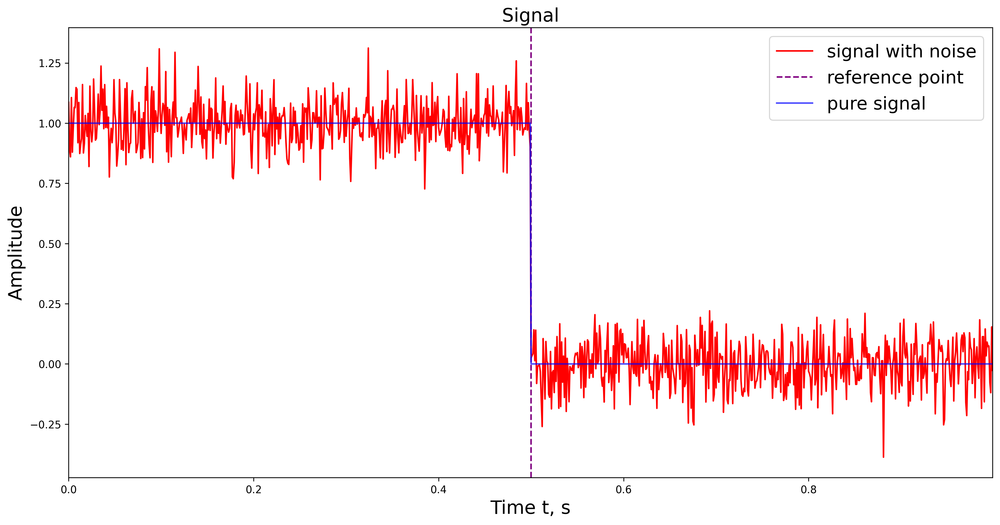

In [7]:
n = 1000
noise_level = 0.1
reference_point = 0.5

time_0, signal_0 = signal_construction(n, reference_point, noise_type='gaussian', noise_level=noise_level)
time, signal = signal_construction(n, reference_point, noise_type='gaussian', noise_level=0.0)

fig, ax = plt.subplots(figsize=(16,8), dpi=300)
plot_signal(ax, time_0, signal_0, plot_color='red', plot_alpha=1.0, plot_label='signal with noise', reference_point=reference_point, rp_color='purple')
plot_signal(ax, time, signal, plot_color='blue', plot_alpha=0.7, plot_label='pure signal', reference_point=None)
plt.show()

Помимо сигнала ступеньки, который мы только что рассмотрели, можно построить сигнал, где спад давления от верхнего до нижнего уровня происходит за характерное время $\delta_w$, которое будем называть **width parameter** или просто **width**. Когда речь идет о сигнале, где имеет место характерное время спада давления, то будем говорить, что это **сигнал с уширением** или **сигнал с шириной**. На отрезке $[t_r - \delta_w, t_r + \delta_w]$ основной сигнал аппроксимируется линейной функцией. Напишем функцию <code><font color='blue'>signal_construction_width</font></code>, которая в дополнение принимает на вход значение <code><font color='black'>width</font></code>.

In [8]:
def signal_construction_width(n, reference_point, noise_type, noise_level, width, dtype='float64'):
    """
    Construction of discrete signal width width of pressure drop from sensor 
    that registers the negative pressure wave.
    
    Parameters
    ----------
    n : int
        Length of discrete signal.
    reference_point : double
        The moment of signal arrival.
    noise_type : str
        Type of noise - 'gaussian' or 'uniform'
    noise_level : double
        Noise level in constructed signal.
    width : double
        Characteristic period of pressure drop.  
    Returns
    -------
    time : array_like
        Time grid on which discrete signal is defined.
    signal : array_like
        Constructed signal.
    """
    if not isinstance(n, int):
        raise TypeError('n should be integer')
    if n <= 1:
        raise ValueError('Wrong value of n: n should be higher than 1')

    time_step = 1.0 / n 
    time = [i * time_step for i in range(n)]
    signal = [0.0 for i in range(n)]

    if not isinstance(reference_point, float):
        raise TypeError('reference_point should be float')
    if reference_point < 0.0 or reference_point > 1.0:
        raise ValueError('Wrong value of t_0: t_0 should be higher than 0.0 and lower than 1.0')
    if not isinstance(noise_level, float):
        raise TypeError('noise_level should be float')
    if noise_level < 0.0 or noise_level > 1.0:
        raise ValueError('Wrong value of noise_level: noise_level should be higher than 0.0 and lower than 1.0')
    if not isinstance(width, float):
        raise TypeError('width should be float')
    if width < 0.0 or width > 1.0:
        raise ValueError('Wrong value of width: width should be higher than 0.0 and lower than 1.0')

    if width == 0:
        time, signal = signal_construction(n, reference_point, noise_type, noise_level, dtype)
        return time, signal
    
    for i in range(len(signal)):
        if time[i] < reference_point - width / 2:
            signal[i] = 1.0
        else:
            if time[i] > reference_point + width / 2:
                signal[i] = 0.0
            else:
                signal[i] = 0.5 - (time[i] - reference_point) / width
    for i in range(len(signal)):
        if noise_type == 'uniform':
            signal[i] = signal[i] + noise_level * (2 * random.random() - 1)
        elif noise_type == 'gaussian':
            signal[i] = signal[i] + random.gauss(0, noise_level)
        else:
            raise ValueError('Wrong value of noise_type: noise_type should be gaussian or uniform')

    time, signal = np.array(time, dtype=dtype), np.array(signal, dtype=dtype)

    return time, signal

Теперь смоделируем сигнал с характерным временем спада давления, то есть с ненулевым <code><font color='black'>width</font></code>.

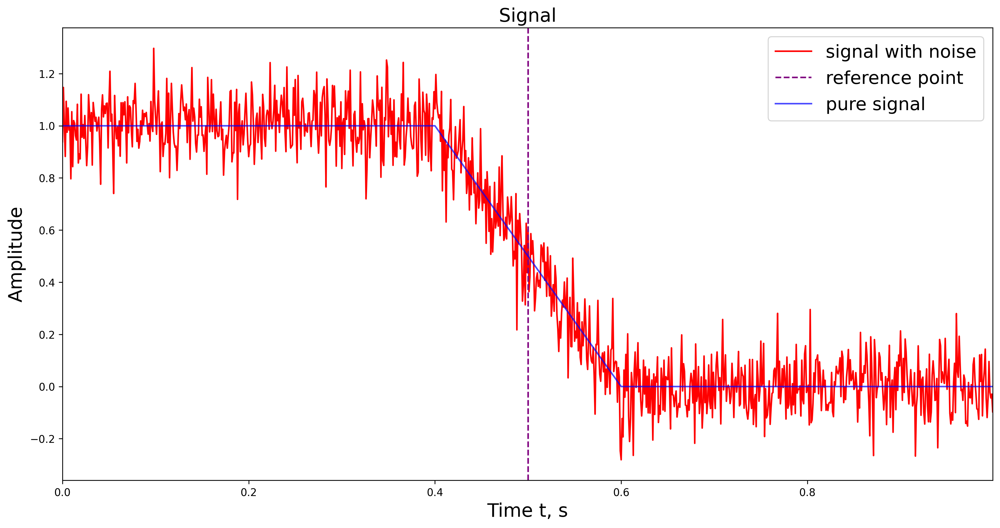

In [9]:
time_0, signal_0 = signal_construction_width(n, reference_point, noise_type='gaussian', noise_level=noise_level, width=0.2)
time, signal = signal_construction_width(n, reference_point, noise_type='gaussian', noise_level=0.0, width = 0.2)

fig, ax = plt.subplots(figsize=(16,8), dpi=300)
plot_signal(ax, time_0, signal_0, plot_color='red', plot_alpha=1.0, plot_label='signal with noise', reference_point=reference_point, rp_color='purple')
plot_signal(ax, time, signal, plot_color='blue', plot_alpha=0.7, plot_label='pure signal', reference_point=None)
plt.show()

Сигнал без ширины можно получить, если положить <code><font color='black'>width = 0.0</font></code>.

Теперь кратко поговорим про то, откуда в сигнале может возникнуть шум, и дадим пояснения, почему мы вводим параметры <code><font color='black'>noise_type</font></code> и <code><font color='black'>noise_level</font></code>. Во-первых, шум может возникнуть из-за изменений параметров гидравлической системы, а во-вторых, он может быть обусловлен скачкообразными измениями, возникаемыми из-за ошибок системы сбора и обработки данных, а также импульсными изменениями в окружающей среде. Малые изменения в гидравлической системе можно рассматривать как **равномерный шум**, а нарушения в системе обработки данных и внешние изменения $-$ как **гауссовский шум**.

В каждый момент отсчета времени (в каждом узле сетки <code><font color='black'>time</font></code>, выдаваемой функцией <code><font color='blue'>signal_construction</font></code>) к основному сигналу $f(t)$ прибавляется добавка $e(t, \chi)$. Добавка $e(t, \chi)$ является случайной величиной либо с равномерным, либо с гауссовским распределением. Плотность равномерного и гауссовского распределений имеет соответсвенно следующий вид

$$ p_U(x, \chi) = \frac{1}{2 \chi} \mathbb{1}_{[-\chi, \chi]}, \quad p_G(x, \chi) = \frac{1}{\chi \sqrt{2\pi}} e^{-x^2/(2\chi^2)}.$$

В обоих распределениях фигурирует параметр $\chi$. В случае равномерного распределения это полуширина интервала, на котором равномерно распределена случайная величина, а в случае гауссовского шума $-$ дисперсия. Чтобы не было путаницы, сначала мы будем конкретизировать, какой тип шума мы накладываем на основной сигнал, а затем задавать значение $\chi$ как параметра конкретного шума (уровня шума).

В реальной ситуации нельзя точно сказать, с каким шумом мы имеем дело, а также точно определить значение параметра $\chi$. Однако в рамках нашей задачи выбор того или иного типа шума и заведомо известного значения $\chi$ явлется приемлемым.  

##  Введение в теорию вейвлет-преобразований

Дадим общие введения и формулировки, связанные с теорией вейвлет-преобразований.

Рассмотрим пространство $\mathcal{L}_p(\mathbb{R})$ функций $f(x)$, для которых выполнено следующее соотношение

$$ \int\limits_{-\infty}^{+\infty} |f(x)|^p dx < \infty.$$

**Свертка** двух функций $f(x), g(x) \in \mathcal{L}_2(\mathbb{R})$, определяется как

$$ f \ast g(x) = \int\limits_{-\infty}^{+\infty} f(u) g(x - u) du.$$

Функция $\psi(x)$ называется **вейвлетом**, если 

$$ \int\limits_{-\infty}^{+\infty} \psi(t)dt = 0, \quad \int\limits_{-\infty}^{+\infty} |\psi(t)|^2 dt = 1 $$

и $\psi$ является центрированной в точке $t = 0$.

Первое условие обращения в нуль интеграла от вейвлет-функции по всей числовой прямой также подразумевает, что для преобразования Фурье $\hat{\psi}(\omega)$ выполнено следующее интегральное неравенство

$$ C_{\psi} = \int_{0}^{+\infty} \frac{|\hat{\psi} (\omega)|^2}{\omega} d \omega < +\infty.$$

Здесь и далее вы введем в рассмотрение следующую функцию

$$\psi_{u, s}(t) = \frac{1}{\sqrt{s}} \psi \left( \frac{t - u}{s} \right),$$

которая получена из исходной функции $\psi$  с помощью преобразования растяжения, определяемого **параметром масштаба** $s$, и сдвига на величину $u$ (сама величина $u$ называется **параметром сдвига**).

**Вейвлет-преобразование** функции $f \in \mathcal{L}_2(\mathbb{R})$ есть свертка

$$\text{W} f(u, s) = \int\limits_{-\infty}^{+\infty} f(t) \frac{1}{\sqrt{s}} \overline{\psi} \left( \frac{t - u}{s} \right) dt.$$

Наглядно представим процесс нахождения свертки сигнала $f(t)$ с вейвлет-функцией $\psi(t)$. Для этого рассмотрим вейвлет, заданный функцией <code><font color='blue'>morlet_wavelet</font></code>. В нашей работе мы рассматриваем вещественнозначные вейвлеты (если, конечно, заранее не оговорено, что вейвлет является комплекснозначным). Поэтому знак комплексного сопряжения в предыдущей формуле можно опустить и рассматривать подынтегральное выражение как произведение сигнала $f(t)$ и преобразованного вейвлета $\psi_{u, s}(t)$.

In [10]:
def morlet_wavelet(t):
    return 0.1 * np.exp(-t**2 / 2) * np.cos(5 * t)

def scaled_wavelet(wavelet, t, u, s):
    return wavelet((t - u) / s) / np.sqrt(s)

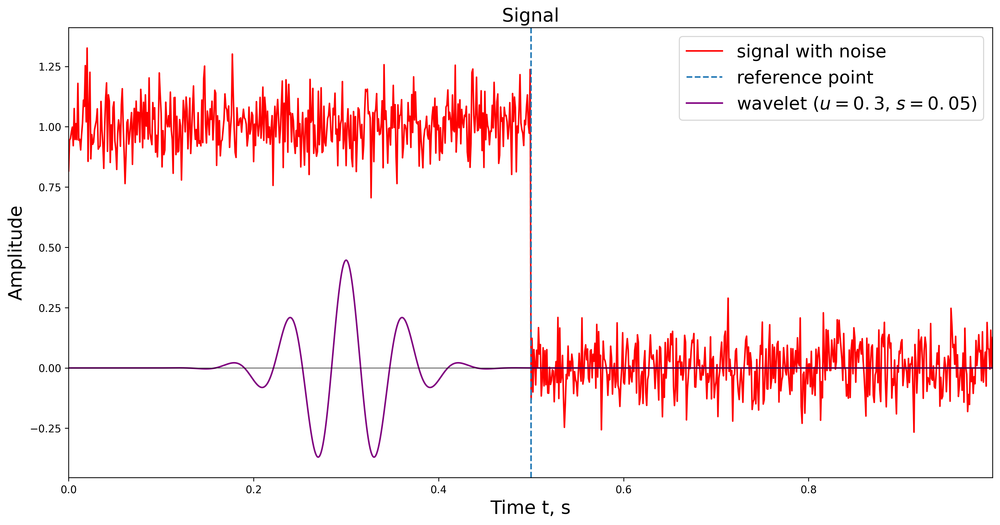

In [11]:
n = 1000
reference_point = 0.5
width = 0.0
time, signal = signal_construction_width(n, reference_point, noise_type='gaussian', noise_level=0.1, width=width)

psi = [0 for i in range(len(time))]
for i in range(len(psi)):
    psi[i] = scaled_wavelet(morlet_wavelet, time[i], 0.3, 0.05)

fig, ax = plt.subplots(figsize=(16, 8), dpi=300)

plot_signal(ax, time, signal, plot_color='red', plot_alpha=1.0, plot_label='signal with noise', reference_point=reference_point, legend_size='xx-large')
ax.plot(time, psi, color='purple', label='wavelet ($u = 0{.}3$, $s = 0{.}05$)')
ax.plot(time, np.zeros(len(time)), color='black', lw=0.5)
plt.legend(fontsize='xx-large')
plt.show()

На графике сверху мы видим график вейвлет-функции $\psi_{u, s}(t)$ при выбранных значениях параметров $u$ и $s$, а также сам сигнал с шумом $x(t)$. Вейвлет мы можем сдвинуть, изменив параметр $u$.

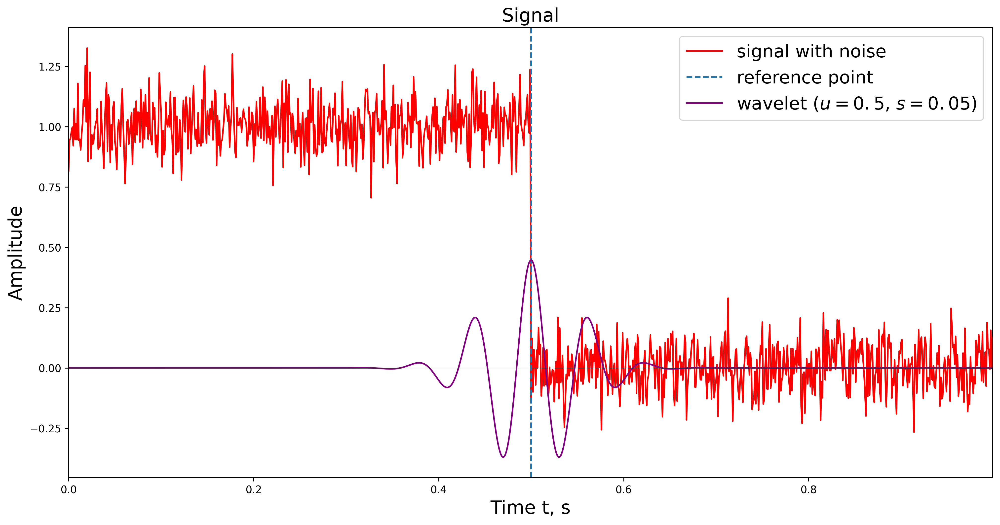

In [12]:
for i in range(len(psi)):
    psi[i] = scaled_wavelet(morlet_wavelet, time[i], 0.5, 0.05)

fig, ax = plt.subplots(figsize=(16, 8), dpi=300)

plot_signal(ax, time, signal, plot_color='red', plot_alpha=1.0, plot_label='signal with noise', reference_point=reference_point, legend_size='xx-large')
ax.plot(time, psi, color='purple', label='wavelet ($u = 0{.}5$, $s = 0{.}05$)')
ax.plot(time, np.zeros(len(time)), color='black', lw=0.5)
plt.legend(fontsize='xx-large')
plt.show()

Также мы имеем возможность растянуть или сжать вейвлет, изменив параметр $s$.

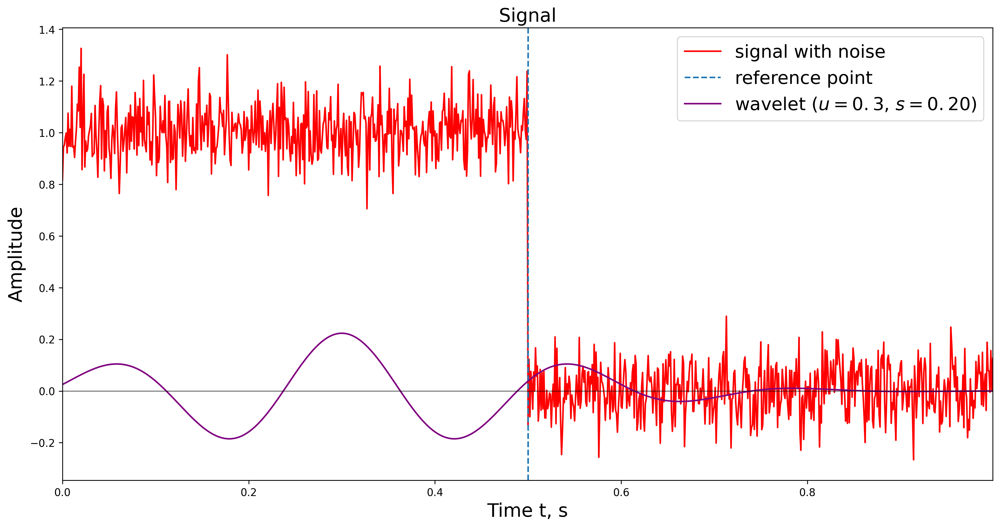

In [13]:
for i in range(len(psi)):
    psi[i] = scaled_wavelet(morlet_wavelet, time[i], 0.3, 0.20)

fig, ax = plt.subplots(figsize=(16, 8), dpi=300)

plot_signal(ax, time, signal, plot_color='red', plot_alpha=1.0, plot_label='signal with noise', reference_point=reference_point, legend_size='xx-large')
ax.plot(time, psi, color='purple', label='wavelet ($u = 0{.}3$, $s = 0{.}20$)')
ax.plot(time, np.zeros(len(time)), color='black', lw=0.5)
plt.legend(fontsize='xx-large')
plt.show()

Рассматривая свертку фиксированного вейвлета $\psi_{u, s}$ и некоторого сигнала $f(t)$ (или же тестового сигнала с шумом $x(t)$, как в нашем случае), получаем некоторое число, которое и является значением непрерывного вейвлет-преобразования $\text{W} f(u, s)$ в точке $(u, s)$. Поскольку мы осуществляем численное интегрирование на заданной временной сетке <code><font color='black'>time</font></code>, то сигнал $f(t)$ с непрерывно изменяющимся параметром $t$ можно заменить на дискретный сигнал $f[n]$, определенный на соответствующей временной сетке.

Дав краткую справку о вейвлетах и вейвлет-преобразовании, мы можем приступить к обоснованию мотивации использования вейвлетов в нашей задаче локализации утечки в трубопроводе методом NPW.

Во-первых, мы можем использовать вейвлет-преобразование с целью определения момента регистрации отрицательной ударной волны датчиком давления. Далее мы покажем, что положение особенностей (сингулярностей) в сигнале $f(t)$ определяется положением максимумов модуля вейвлет-преобразования $|\text{W} f(u, s)|$ на плоскости $(u, s)$ и их сходимостью при $s \rightarrow 0$. Также мы предложим алгоритм, который позволяет эффективно найти значение $t_r$ (reference point) за счёт анализа вейлет-диаграммы тестового сигнала с вейвлетом <code><font color='maroon'>gaus1</font></code>, который является первой производной фунцкии Гаусса.

Во-вторых, как уже было сказано раннее, с датчиков мы получаем сигнал $x(t)$, на который накладывается внешний шум. Вейвлет-преобразование позволяет эффективно отделить аппроксимирующую информацию в сигнале от деталей, а threshold-процедура, которая будет также описана позже, дает возможность удалить шум в детализирующих компонентах исходного сигнала $x(t)$. Последующее восстановление сводится к получению отфильтрованного сигнала $\hat{x}(t)$, близкого к основному сигналу $f(t)$. Дальнейшая работа сводится к оценке качества восстановления сигнала и определения оптимального набора параметров, которые необходимо задать при фильтрации.

##  Гладкость по Липшицу. Метод максимумов модуля.

Особенности и негладкие структуры часто содержат главную информацию о сигнале. В нашей задаче определение времени прихода отрицательной ударной волны к датчику давления $t_r$ сводится к нахождению особенности в функции $x(t)$, сигнала с датчика. В случае сигнала-ступеньки этой особенностью является разрыв первого рода (отсутствие непрерывности в точке $t_r$), а в случае сигнала с шириной $--$ отсутствие дифференцируемости в точке $t_r$.

Мощным инструментом в исследовании особенностей и нерегулярностей в сигнале является вейвлет-преобразование. Вейвлет-преобразование может фокусироваться на локальных структурах сигнала с помощью приближения и удаления объектов (зум-процедуры), которая постепенно уменьшает масштабный параметр $s$. Далее мы покажем, что локальная гладкость сигнала характеризуется убыванием амплитуды вейвлет-преобразования с уменьшением масштаба. Особенности и перепады выделяются исследованием локальных максимумов вейвлет-преобразования при малых масштабах.

Формула Тейлора связывает дифференцируемость сигнала с локальной полиномиальной аппроксимацией. Предположим, что функция $f(t)$ $m$ раз дифференцируема на отрезке $[\nu - h, \nu + h]$. Пусть $P_{\nu}(t)$ $-$ многочлен Тейлора функции $f$ в окрестности точки $\nu$:

$$ P_{\nu}(t) = \sum\limits_{k = 0}^{m-1} \frac{f^{(k)}(\nu)}{k!} (t - \nu)^{k}.$$

Из формулы Тейлора следует, что погрешность аппроксимации

$$ \varepsilon_{\nu}(t) = f(t) - P_{\nu}(t) $$

удовлетворяет условию

$$ \forall t \in [\nu - h, \nu + h] \quad |\varepsilon_{\nu}(t)| \leqslant \frac{|t - \nu|^m}{m!} \sup_{u \in [\nu - h, \nu + h]}f^{(m)}(u).$$

Следовательно, $m$-ый порядок дифференцируемости $f$ в окрестности $\nu$ определяет верхнюю границу погрешности $\varepsilon_{\nu}(t)$ при $t \rightarrow \nu$. **Гладкость Липшица** уточняет эту верхнюю границу введением нецелого показателя.

**Определение**. Функция $f(t)$ удовлетворяет **условию Липшица** с показателем $\alpha \geqslant 0$ в точке $\nu$, если существует $K \geqslant 0$ и многочлен $P_{\nu}(t)$ степени $m = \lfloor \alpha \rfloor$ такие, что

$$\forall t \in \mathbb{R} \quad |f(t) - P_{\nu}(t)| \leqslant K |t - \nu|^{\alpha}. $$

Функция $f$ удовлетворяет **равномерному условию Липшица** $\alpha$ на отрезке $[a, b]$, если она удовлетворяет предыдущему равенству для всех $\nu \in [a, b]$ с контстантой $K$, не зависящей от $\nu$.

Гладкость Липшица функции $f$ в точке $\nu$ или на $[a, b]$ есть верхняя грань $\alpha$ таких, что удовлетворяет условию Липшица в точке $\alpha$.

Функция $f(t)$ называется **сингулярной** в точке $\nu$, если она не является регулярной по Липшицу с показателем $\alpha = 1$ в точке $\nu$.

Дадим определенные ограничения на вейвлет-функции, используемые в дальнейших рассуждениях. Но для этого дадим еще пару необходимых определений.

Говорят, что вевлет $\psi(x)$ имеет $n$ **нулевых моментов**, если для любого натурального $k < n$ выполнены следующие равенства

$$ \int \limits_{-\infty}^{\infty} x^k \psi(x) dx = 0.$$

Говорят, что $\psi$ имеет **быстрое убывание** если для любого $m \in \mathbb{N}$ существует константа $C_m$ такая, что

$$ \forall t \in \mathbb{R} \quad |\psi(t)| \leqslant \frac{C_m}{1 + |t|^m}. $$

Мы будем предполагать, что вейвлет $\psi$ имеет $n$ нулевых моментов и принадлежит классу гладкости $\mathcal{C}^n$ с быстроубывающими производными.

............................... ДОПИСАТЬ ТЕОРИЮ .........................

Реализуем функции <code><font color='blue'>wavelet_transform</font></code> и <code><font color='blue'>plot_wavelet_transform</font></code> для расчета и построения вейвлет-преобразования сигнала <code><font color='black'>signal</font></code>, заданного на временной сетке <code><font color='black'>time</font></code>.

In [14]:
def wavelet_transform(time, signal, scales, waveletname, dtype='float64'):
    time, signal = np.array(time, dtype=dtype), np.array(signal, dtype=dtype)
    if time.ndim != 1:
        raise TypeError('time is not one-dimensional array')
    if signal.ndim != 1:
        raise TypeError('signal is not one-dimensional array')
    if time.shape != signal.shape:
        raise ValueError('time and signal lengths do not match')

    scales = np.array(scales, dtype=dtype)
    if scales.ndim != 1:
        raise TypeError('scales is not one-dimensional array')

    """
    Необходимо сделать проверку вейвлета
    """

    dt = time[1] - time[0]
    [coefficients, frequencies] = pywt.cwt(signal, scales, waveletname, dt)
    power = abs(coefficients)
    scale = 1.0 / frequencies

    return [time, scale, coefficients]

In [15]:
def plot_wavelet_transform(ax, time, signal, scales, waveletname, reference_point=None, rp_color=None, legend_size='large', dtype='float64'):
    """
    Plot wavelet-transform diagram of input signal

    Parameters
    ----------
    ax : class matplotlib.axes
        Variable of matplotlib Axes class, referring to the coordinate grid for plotting
    time : array_like
        Time grid on which discrete signal is defined.
    signal : array_like
        Test signal.
    scales : array_like
        _______________________
    waveletname : Wavelet object or name
        Wavelet to use
    reference_point: double or None
        _______________________
    rp_color: color or None
        _______________________
    """
    time, signal = np.array(time, dtype=dtype), np.array(signal, dtype=dtype)
    if time.ndim != 1:
        raise TypeError('time is not one-dimensional array')
    if signal.ndim != 1:
        raise TypeError('signal is not one-dimensional array')
    if time.shape != signal.shape:
        raise ValueError('time and signal lengths do not match')

    scales = np.array(scales, dtype=dtype)
    if scales.ndim != 1:
        raise TypeError('scales is not one-dimensional array')

    """
    Необходимо сделать проверку вейвлета
    """

    dt = time[1] - time[0]
    [coefficients, frequencies] = pywt.cwt(signal, scales, waveletname, dt)
    power = abs(coefficients)
    scale = 1.0 / frequencies
    contourlevels = np.arange(-4.0, 4.0, 0.5)

    im = ax.contourf(time, np.log2(scale), np.log2(power), contourlevels, extend='both')
    
    ax.set_xlabel('Time t, s', fontsize=18)
    ax.set_ylabel('Scale s', fontsize=18)
    ax.set_title('Wavelet Transform (Power Spectrum) of signal', fontsize=18)
    
    ax.axvline(x=reference_point, linestyle='dashed', color=rp_color, label='reference point')

    ax.set_xlim([time[0], time[-1]])
    yticks = 2**np.arange(np.ceil(np.log2(scale.min())), np.ceil(np.log2(scale.max())))
    ax.set_yticks(np.log2(yticks))
    ax.set_yticklabels(yticks)
    ax.invert_yaxis()
    ylim = ax.get_ylim()
    ax.set_ylim(ylim[0], -5)
    
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    plt.colorbar(im, cax=cax, orientation='vertical')
    plt.tight_layout()

    ax.legend(fontsize=legend_size)

    return [time, scale, coefficients]

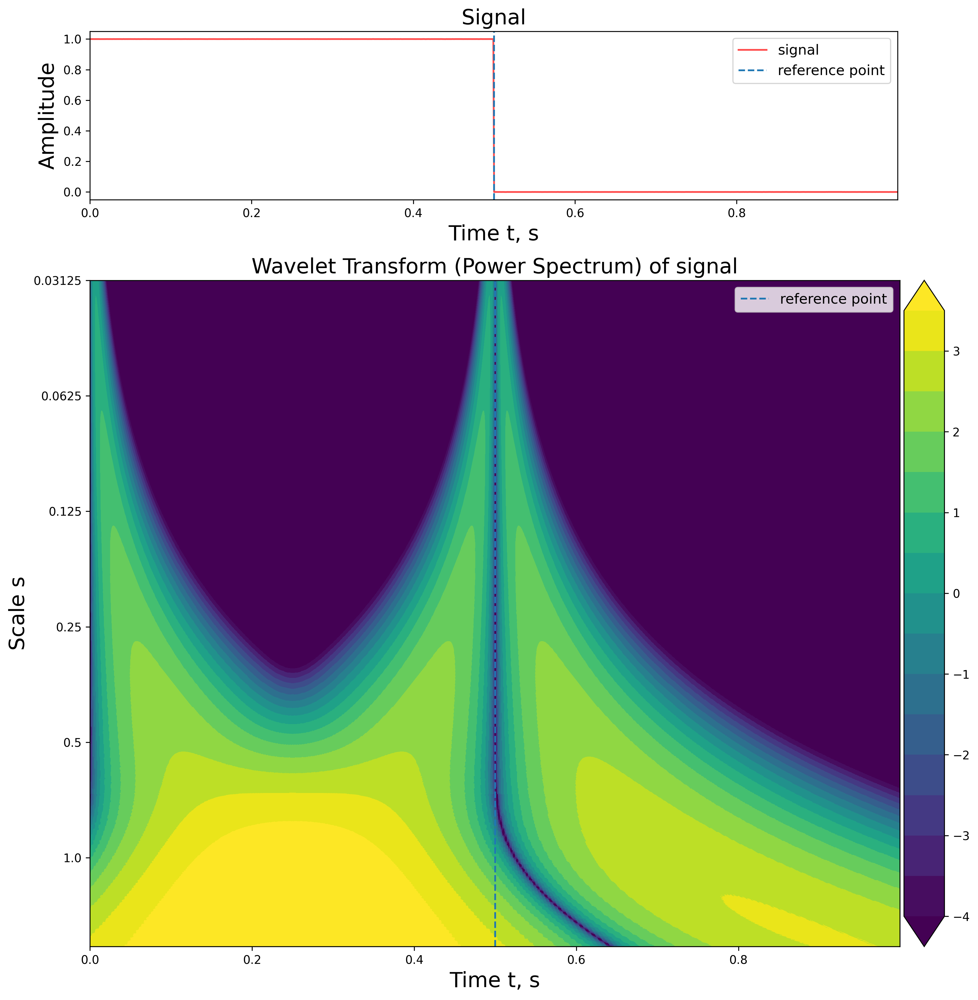

In [16]:
n = 1000
reference_point = 0.5
noise_level = 10e-5
width = 0.0
time, signal = signal_construction_width(n, reference_point, noise_type='gaussian', noise_level=noise_level, width=width)

fig = plt.figure(figsize=(12 ,12), dpi=300)
spec = gridspec.GridSpec(ncols=20, nrows=8)
top_ax = fig.add_subplot(spec[0:2, 0:18])
bottom_ax = fig.add_subplot(spec[2:, 0:19])

plot_signal(top_ax, time, signal, plot_color='red', plot_alpha=0.7, plot_label='signal', reference_point=reference_point, legend_size='large')

scales = np.arange(1, 512, 1.0)

time, scale, coefficients = plot_wavelet_transform(bottom_ax, time, signal, scales, waveletname='gaus2', reference_point=reference_point, rp_color=None, legend_size='large')
plt.show()

Мы получили вейвлет-диаграмму тестового сигнала с шумом $x(t)$, свернутого с вейвлетом **gaus2**.

С помощью функции <code><font color='blue'>maximum_of_wavelet_transform</font></code> реализуем построение диаграммы, на которой изображены локальные максимумы модуля вейвлет-преобразования $\text{W} f(u, s)$.

In [17]:
def maximum_of_wavelet_transform_modulus(ax, time, scale, coefficients, reference_point=None, rp_color=None, legend_size='large'):
    """
    Plot the diagram of local maxima of the wavelet transform modulus

    Parameters
    ----------
    ax : class matplotlib.axes
        Variable of matplotlib Axes class, referring to the coordinate grid for plotting
    time : array_like
        Time grid on which discrete signal is defined.
    signal : array_like
        Test signal.
    scale : array_like
        Scale grid on which the wavelet transform is set
    reference_point: double or None
        _______________________
    rp_color: color or None
        _______________________
    
    """

    def find_local_max(sequence):
        index_local_max = []
        for i in range(1, len(sequence) - 1):
            if sequence[i] > sequence[i-1] and sequence[i] >= sequence[i+1] or sequence[i] >= sequence[i-1] and sequence[i] > sequence[i+1]:
                index_local_max.append(i)
        return index_local_max

    for i in range(len(scale)):
        index_local_max = find_local_max(abs(coefficients[:][i]))
        time_local_max = []
        scale_local_max = []
        for j in range(len(index_local_max)):
            time_local_max.append(time[index_local_max[j]])
            scale_local_max.append(np.log2(scale[i]))
        ax.scatter(time_local_max, scale_local_max, color='black', s=0.05)

    ax.set_xlabel('Time t, s', fontsize=18)
    ax.set_ylabel('Scale s', fontsize=18)
    ax.set_title('Local maximums of wavelet transform modulus', fontsize=18)

    ax.axvline(x=reference_point, linestyle='dashed', color=rp_color, label='reference point')

    yticks = 2**np.arange(np.ceil(np.log2(scale.min())), np.ceil(np.log2(scale.max())))
    ax.set_yticks(np.log2(yticks))
    ax.set_yticklabels(yticks)
    ax.invert_yaxis()
    ax.set_ylim(1, -8)
    
    ax.legend(fontsize=legend_size)

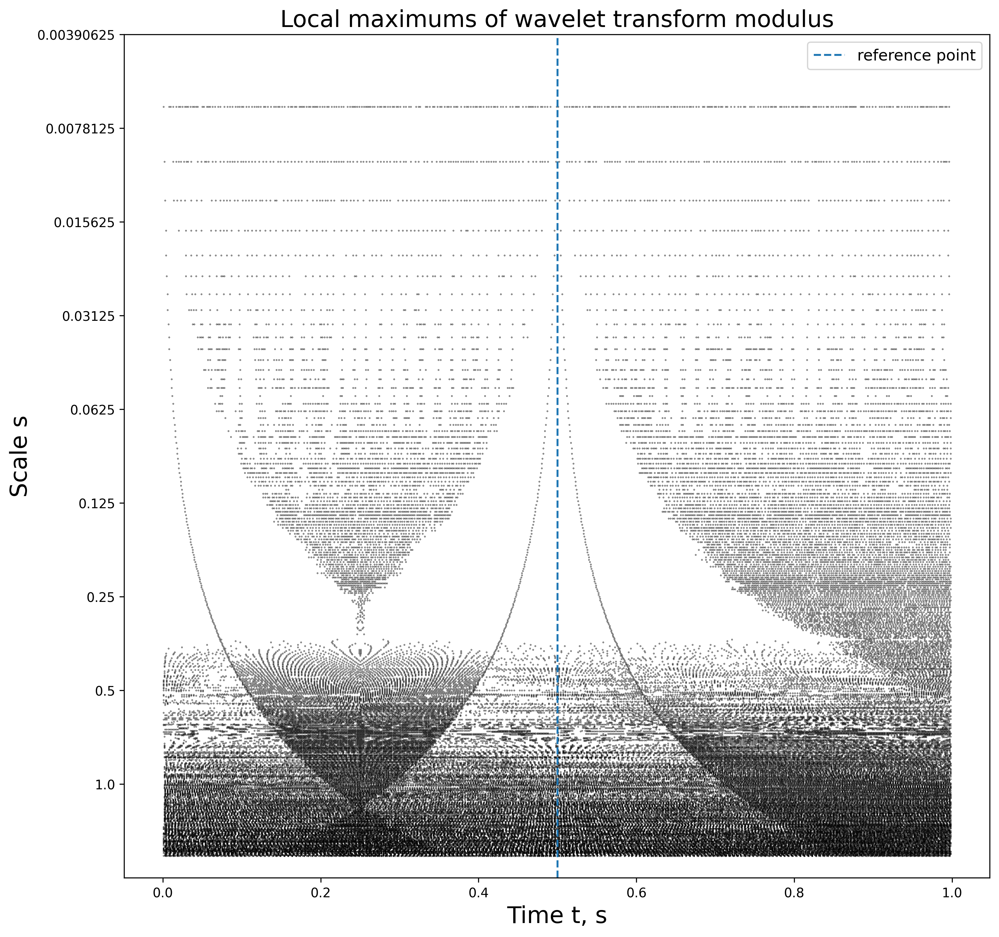

In [18]:
fig, ax = plt.subplots(figsize=(12,12), dpi=300)

maximum_of_wavelet_transform_modulus(ax, time, scale, coefficients, reference_point=reference_point, rp_color=None, legend_size='large')
ax.legend(fontsize='large')
plt.show()

Рассмотрим, что будет с вейвлет-диаграммой и распределением максимумов модуля, если в качестве сигнала использовать сигнал с шумом и сигнал с шириной.

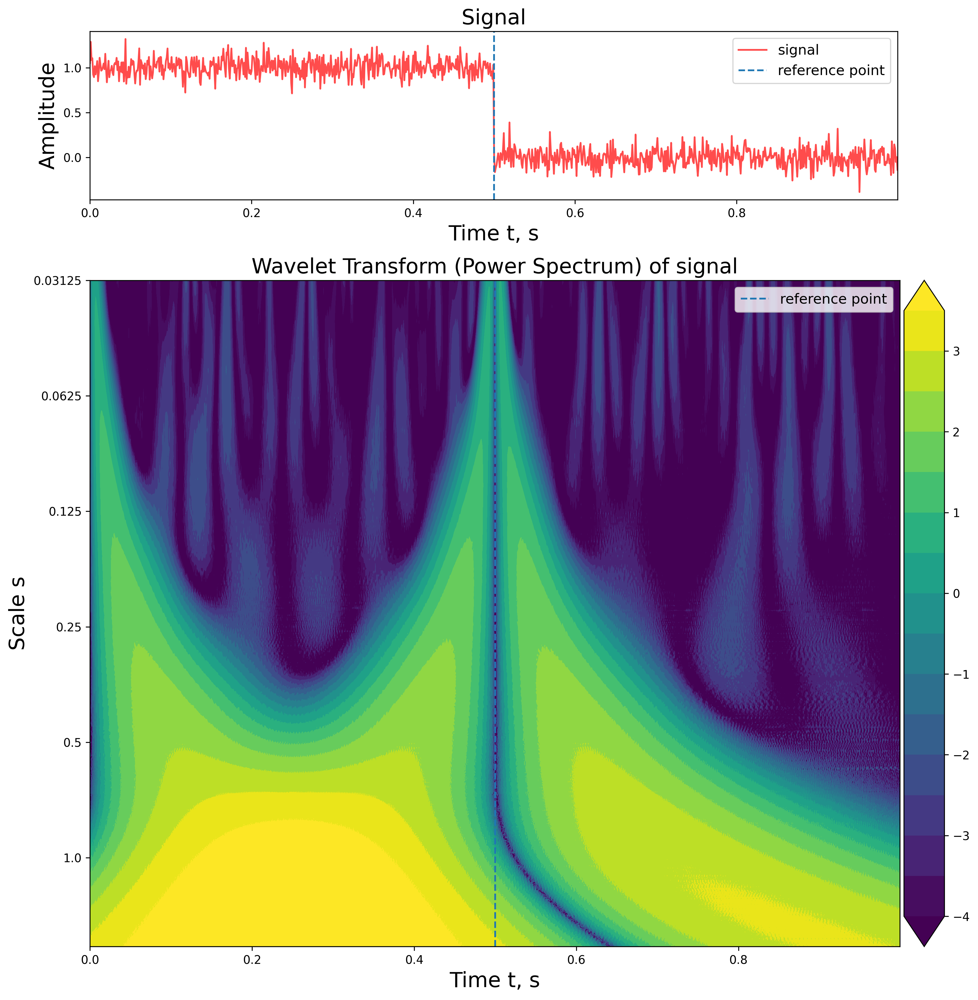

In [19]:
n = 1000
reference_point = 0.5
noise_level = 0.1
width = 0.0
time, signal = signal_construction_width(n, reference_point, noise_type='gaussian', noise_level=noise_level, width=width)

fig = plt.figure(figsize=(12 ,12), dpi=300)
spec = gridspec.GridSpec(ncols=20, nrows=8)
top_ax = fig.add_subplot(spec[0:2, 0:18])
bottom_ax = fig.add_subplot(spec[2:, 0:19])

plot_signal(top_ax, time, signal, plot_color='red', plot_alpha=0.7, plot_label='signal', reference_point=reference_point, legend_size='large')

scales = np.arange(1, 512, 1.0)

time, scale, coefficients = plot_wavelet_transform(bottom_ax, time, signal, scales, waveletname='gaus2', reference_point=reference_point, rp_color=None, legend_size='large')
plt.show()

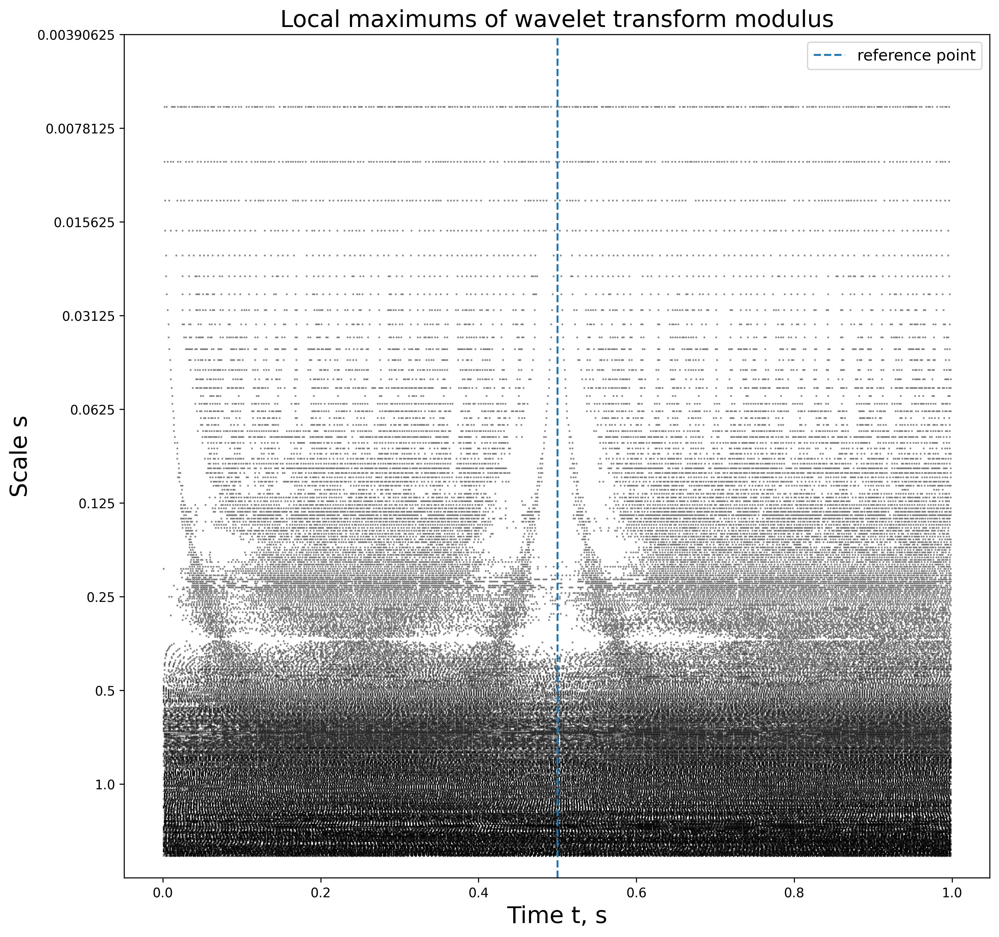

In [20]:
fig, ax = plt.subplots(figsize=(12,12), dpi=300)

maximum_of_wavelet_transform_modulus(ax, time, scale, coefficients, reference_point=reference_point, rp_color=None, legend_size='large')
ax.legend(fontsize='large')
plt.show()

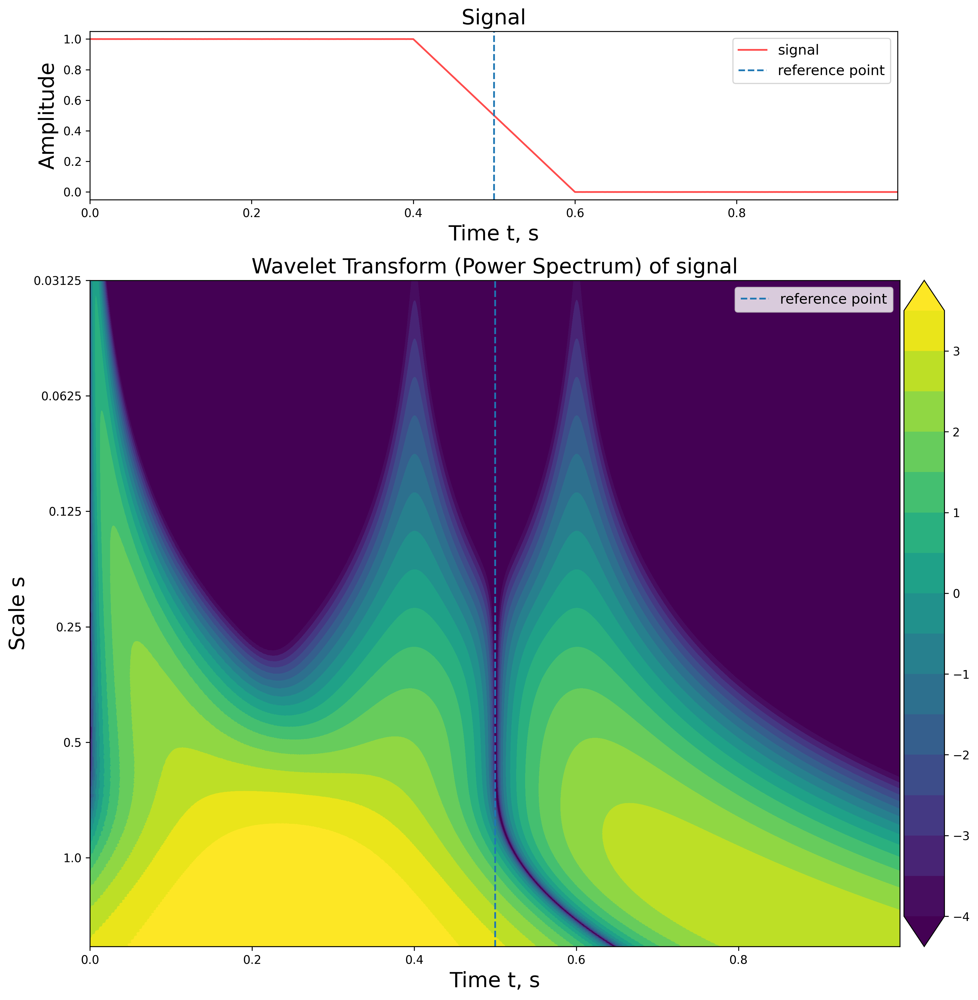

In [21]:
n = 1000
reference_point = 0.5
noise_level = 10e-5
width = 0.2
time, signal = signal_construction_width(n, reference_point, noise_type='gaussian', noise_level=noise_level, width=width)

fig = plt.figure(figsize=(12 ,12), dpi=300)
spec = gridspec.GridSpec(ncols=20, nrows=8)
top_ax = fig.add_subplot(spec[0:2, 0:18])
bottom_ax = fig.add_subplot(spec[2:, 0:19])

plot_signal(top_ax, time, signal, plot_color='red', plot_alpha=0.7, plot_label='signal', reference_point=reference_point, legend_size='large')

scales = np.arange(1, 512, 1.0)

time, scale, coefficients = plot_wavelet_transform(bottom_ax, time, signal, scales, waveletname='gaus2', reference_point=reference_point, rp_color=None, legend_size='large')
plt.show()

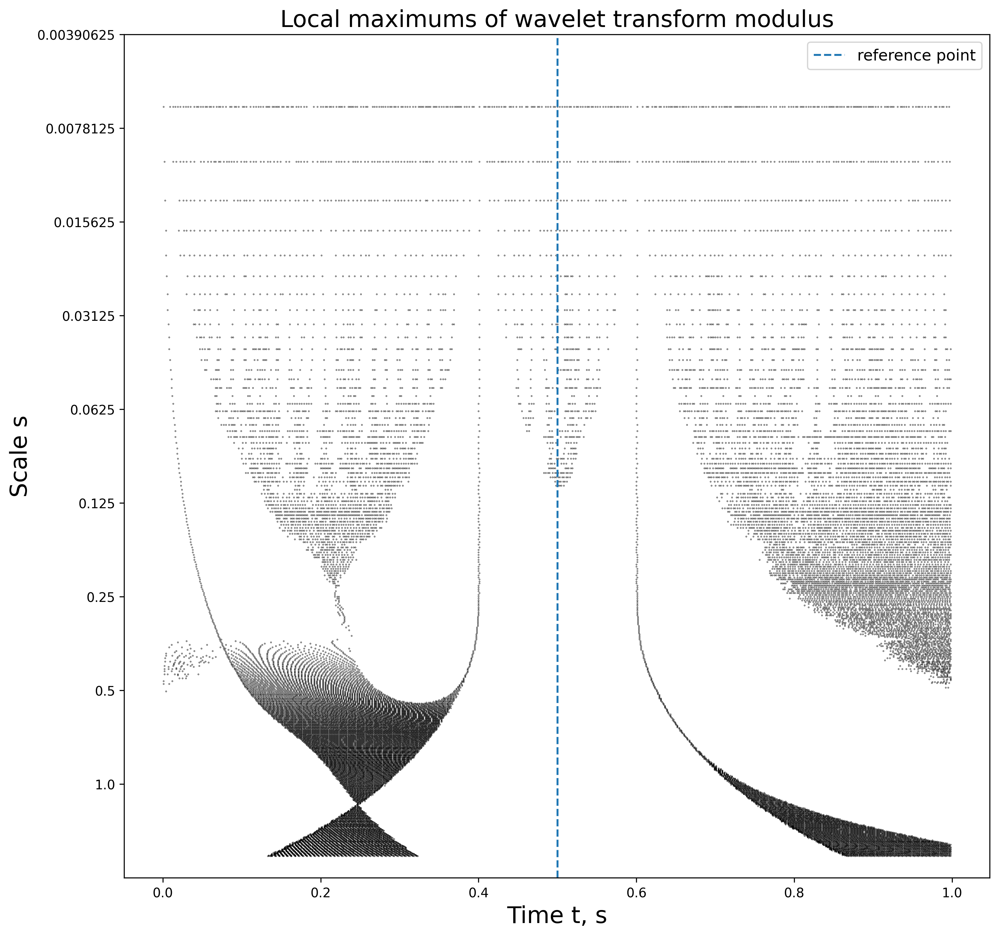

In [22]:
fig, ax = plt.subplots(figsize=(12,12), dpi=300)

maximum_of_wavelet_transform_modulus(ax, time, scale, coefficients, reference_point=reference_point, rp_color=None, legend_size='large')
ax.legend(fontsize='large')
plt.show()

##  Алгоритм 'Gutter search' для нахождения reference point.

Данный алгоритм позволяет найти значение reference point $t_r$ по вейвлет-диаграмме тестового сигнала, свернутого с вейвлетом **gaus1**, (вейвлет реализован в модуле **pywt**).
	
Для начала построим вейвлет-диаграмму для тестового сигнала с шумом $x(t)$, свернутого с вейвлетом **gaus1**. Значение reference point для данного сигнала $t_r = 0{,}5$.

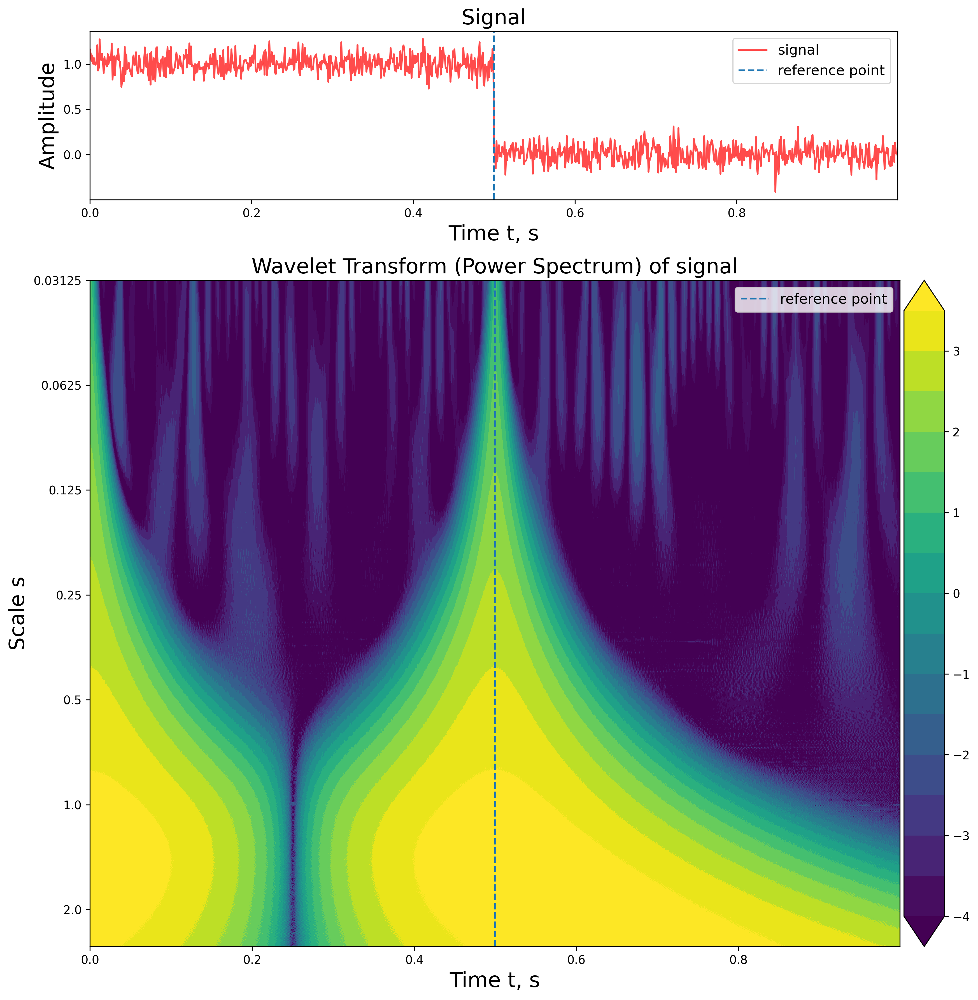

In [23]:
n = 1000
reference_point = 0.5
noise_level = 0.1
width = 0.0
time, signal = signal_construction_width(n, reference_point, noise_type='gaussian', noise_level=noise_level, width=width)

fig = plt.figure(figsize=(12 ,12), dpi=300)
spec = gridspec.GridSpec(ncols=20, nrows=8)
top_ax = fig.add_subplot(spec[0:2, 0:18])
bottom_ax = fig.add_subplot(spec[2:, 0:19])

plot_signal(top_ax, time, signal, plot_color='red', plot_alpha=0.7, plot_label='signal', reference_point=reference_point, legend_size='large')

scales = np.arange(1, 512, 1.0)

time, scale, coefficients = plot_wavelet_transform(bottom_ax, time, signal, scales, waveletname='gaus1', reference_point=reference_point, rp_color=None, legend_size='large')

На диаграмме можно наблюдать "желоб" $-$ линию в плоскости $(u, s)$, где вейвлет-преобразование обращается в нуль (вейвлет-диаграмма на рисунке представлена в логарифмической шкале, для удобства построен модуль вейвлет-преобразования $|\text{W} f(u, s)|$). Объясним наличие данного желоба. Для этого изучим свойства вейвлета **gaus1**, которые позволят реализовать наш алгоритм. Рассмотрим вейвлет-функцию

$$ \psi(t) = te^{-t^2/2},$$

которая с точностью до множителя $-1$ является производной гауссовой функции. Эта функция является нечетной. Осуществим сдвиг данной функции на величину $u = t_r/2$. Теперь вейвлет оказывается центрированным в точке $t_r/2$.

In [24]:
def gaus1_wavelet_plot(ax, shift, scale):
    wavelet = pywt.ContinuousWavelet('gaus1')
    [psi, t] = wavelet.wavefun(level=10)
    
    for i in range(len(t)):
        t[i] = scale * t[i] + shift
        psi[i] = psi[i] * np.sqrt(scale)
    
    t_left =  []
    t_right = []
    psi_left = []
    psi_right = []
    for i in range(len(t)):
        if 0 < t[i] < shift:
            t_left.append(t[i])
            psi_left.append(psi[i])
        if 0.25 < t[i] < 0.50:
            t_right.append(t[i])
            psi_right.append(psi[i])

    ax.plot(t, psi, color='black')
    ax.plot(t, np.zeros(len(t)), color='black')
    ax.fill_between(t_left, psi_left, 0, color='cornflowerblue', alpha=0.5)
    ax.fill_between(t_right, psi_right, 0, color='orange', alpha=0.5)
    ax.axvline(x=shift, linestyle='dashed', color='orange', label='gutter position')

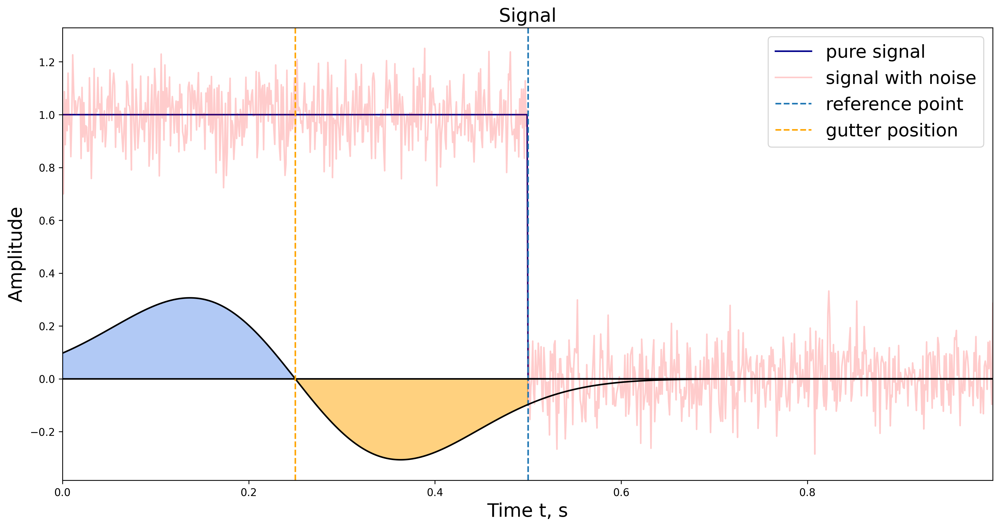

In [25]:
n = 1000
reference_point = 0.5
width = 0.0
time, signal = signal_construction_width(n, reference_point, noise_type='gaussian', noise_level=0.1, width=width)
time_0, signal_0 = signal_construction_width(n, reference_point, noise_type='gaussian', noise_level=0.0, width=width)

fig, ax = plt.subplots(figsize=(16, 8), dpi=300)

plot_signal(ax, time_0, signal_0, plot_color='darkblue', plot_alpha=1.0, plot_label='pure signal', reference_point=None, legend_size='xx-large')
plot_signal(ax, time, signal, plot_color='red', plot_alpha=0.2, plot_label='signal with noise', reference_point=reference_point, legend_size='xx-large')
gaus1_wavelet_plot(ax, shift=0.25, scale=0.16)
ax.legend(fontsize='xx-large')
plt.show()

Если рассмотреть свертку данного вейвлета с сигналом-ступенькой без шума $f(t)$ (на графике сверху сигнал изображен синей линией), то получим, что часть вейвлета при $t > t_r$ и $t < 0$ "обрезается". Вейвлет-преобразование в точке сдвига $u$ (выделено оранжевой пунктирной линией) есть

$$ \text{W} f(u, s) = \int\limits_{0}^{t_r} \frac{1}{\sqrt{s}} \psi \left( \frac{t - u}{s} \right) dt.$$

Так как подынтегральная функция симметрична относительно центра отрезка интегрирования $[0, t_r]$, то  полученный интеграл обращается в нуль. В других точках $t$ свертка вейвлета $\psi$ с сигналом-ступенькой $f$ отлична от тождественного нуля (далее этот момент будет рассмотрен более детально).

При реальных вычислениях мы получаем свертку вейвлет-функции с сигналом с шумом $x(t)$, который отличен от ступеньки. Но, несмотря на это, вейвлет-преобразование в точке $t = t_r/2$ все равно близко к нулю. Поэтому наша задача $-$ при фиксированном значении параметра масштаба $s = s_0$ найти точку минимума $u_{\min}$ функции одной переменной $|W f(u, s_0)|$. Точка минимума и будет определять положение "желоба". Удвоенное значение $u_0 = 2 u_{\min}$ определяет положение reference point.

Осуществим нахождение reference point предложенным алгоритмом. 

In [26]:
def gutter_method(time, scale, power, lower_scale, upper_scale, optimal_variance=0.05):
    """
    Find the value of reference point using the gutter method 

    Parameters
    ----------
    
    time : array_like
        Time grid on which discrete signal is defined.
    scale : array_like
        Scale grid on which the wavelet transform is set.
    power : array_like
        Modulus of coefficients of continious wavelet transform calculated on
        time and scale grids.
    reference_point: double or None
        _______________________
    rp_color: color or None
        _______________________
    
    """
    in_interval = sum(lower_scale < x < upper_scale for x in scale)
    average = 0
    variance = 0

    for i in range(len(scale)):
        if lower_scale < scale[i] < upper_scale:
            average = average + np.argmin(power[i][0:int(len(time)) // 2])/in_interval
    index_rp_exp = int(np.floor(2 * average))

    for i in range(len(scale)):
        if lower_scale < scale[i] < upper_scale:
            variance = variance + (average - np.argmin(power[i][0:int(len(time)) // 2]))**2/in_interval
    variance = 2 * np.sqrt(variance) * (time[1] - time[0])

    if variance < optimal_variance:
        return time[index_rp_exp], variance
    else:
        raise ValueError('Gutter method can not find the value of reference point with optimal variance!')

In [27]:
def gutter_method_rectangle_plot(ax, gutter_result, lower_scale, upper_scale):
    reference_point_exp, variance = gutter_result
    left, bottom, width, height = (reference_point_exp / 2 - variance / 2, np.log2(lower_scale), variance, upper_scale - lower_scale)
    rect = plt.Rectangle((left, bottom), width, height, fill=None, edgecolor='red', linewidth=1.0)
    ax.add_patch(rect)

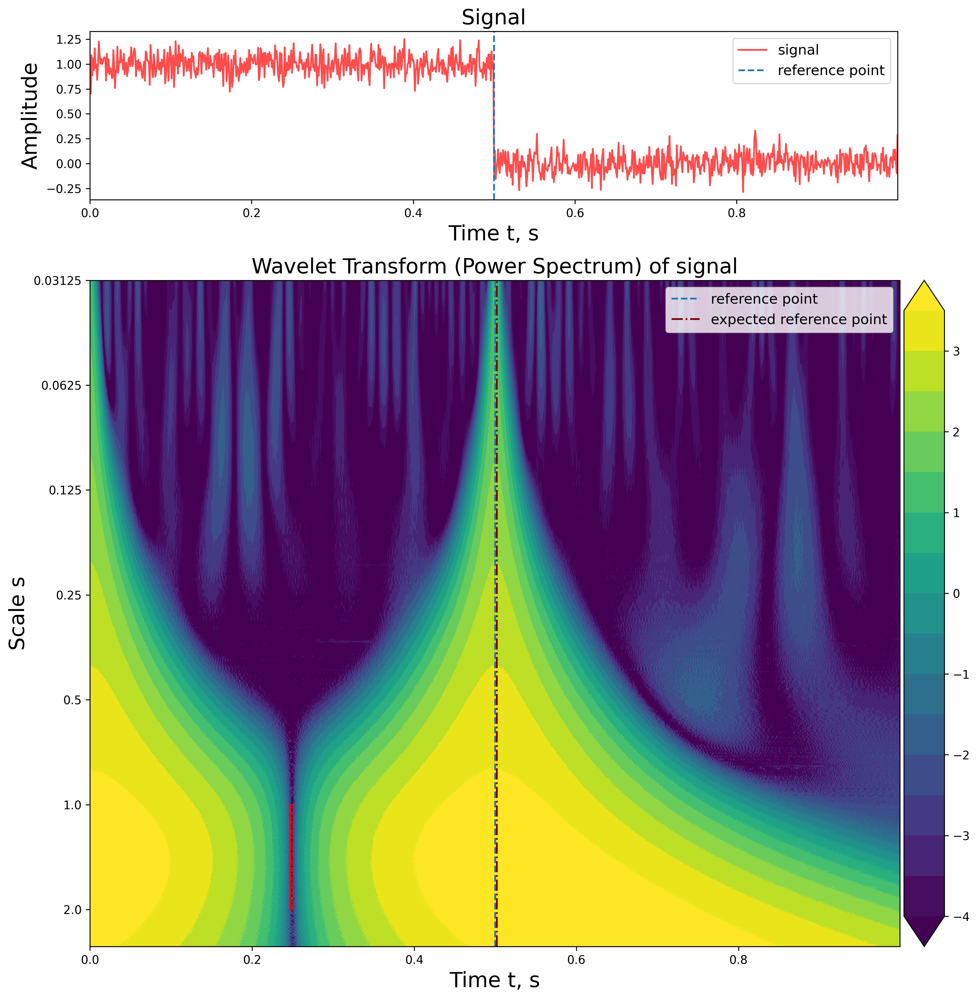

In [28]:
fig = plt.figure(figsize=(12 ,12), dpi=300)
spec = gridspec.GridSpec(ncols=20, nrows=8)
top_ax = fig.add_subplot(spec[0:2, 0:18])
bottom_ax = fig.add_subplot(spec[2:, 0:19])

plot_signal(top_ax, time, signal, plot_color='red', plot_alpha=0.7, plot_label='signal', reference_point=reference_point, legend_size='large')

scales = np.arange(1, 512, 1.0)

time, scale, coefficients = plot_wavelet_transform(bottom_ax, time, signal, scales, waveletname='gaus1', reference_point=reference_point, rp_color=None, legend_size='large')

gutter_result = gutter_method(time, scale, power=abs(coefficients), lower_scale=1.0, upper_scale=2.0)
(reference_point_exp, variance) = gutter_result

distance = 0.004

bottom_ax.axvline(x=reference_point_exp + distance, linestyle='dashdot', color='maroon', label='expected reference point')
gutter_method_rectangle_plot(bottom_ax, gutter_result=gutter_result, lower_scale=1.0, upper_scale=2.0)

bottom_ax.legend(fontsize='large')
plt.show()

##  Дискретное вейвлет-преобразование

###  Теория фильтров. Декомпозиция Хаара

Итак, мы исследовали свойства вейвлет-ппреобразования для построения алгоритмов, позволяющих найти значение $t_r$ в сигнале давления. На данном этапе мы столкнулись с проблемой, что при больших шумах подобные алгоритмы могут работать некорректно. Поэтому сейчас перед нами стоит следующая задача $-$ научиться фильтровать тестовый сигнал $x(t)$, то отделять в нем основной сигнал $f(t)$, несущий основную информацию о процессе распространении ударной волны в трубопроводе, от шума $e(t, \chi).$ Для этого мы также будем использовать вейвлет-преобразование.

Теория фильтрации сигналов сводится к построению **фильтров**. В нашем случае под фильтром мы будем понимать некоторый оператор, который каждому дискретному сигналу $f$ ставит в соответствие новый сигнал $f'$. Сигналы $f$ и $f'$ не обязательно имеют одинаковую длину (разрежение или расширение сигнала зависит от свойств конкретного фильтра).

Для начала рассмотрим простой пример применения фильтров. Пусть задана последовательность чисел

$$ f = \lbrace 8, 4, 6, 8, 9, 7, 2, 4 \rbrace.$$

Пока нам не важно, на каких временной сетке задан сигнал. Сгруппируем элементы последовательности в пары и вычислим полусуммы элементов в каждой паре. Выпишем найденные полусуммы, образовывая новую последовательность $f'$. Новая последовательность имеет следующий вид

$$ f' = \lbrace 6, 7, 8, 3\rbrace.$$

Для тех же самых пар вычисляем полуразности и образуем другую последовательность $d'$. 

$$ d' = \lbrace 2, -1, 1, -1\rbrace.$$

Процедуру построения последовательностей $f'$ и $d'$ можно воспринимать следующим образом: к исходной последовательности $f$ было применено два фильтра $\mathcal{H}$ и $\mathcal{G}$. Для новых последовательностей можно записать следующие равенства

$$ f' = \mathcal{H} f, \quad d' = \mathcal{G} f.$$

Фильтры $\mathcal{H}$ и $\mathcal{G}$ называют **фильтрами с децимацией** (или **фильтрами с разреживанием**), поскольку длина новой последовательности уменьшилась в два раза (в случае, если число элементов исходной последовательности четное). Стоит отметить, что если число элементов исходной последовательности $f$ было бы нечетным, то к последовательности следовало бы приписать нуль и организовать пару из последнего элемемента $f$ с нулем. Таким образом, число элементов новых последовательностей равно $\lfloor n + 1 \rfloor$, где $n$ $-$ длина последовательности $f$.

Фильтрам $\mathcal{H}$ и ${G}$ мы можем приписать последовательность коэффициентов $\lbrace h_i \rbrace$ и $\lbrace g_i \rbrace$, которые определяют преобразование последовательности $f$. Для постренных фильтров

$$  h_i = \left( \frac{1}{2}, \frac{1}{2} \right), \: g_i = \left( - \frac{1}{2}, \frac{1}{2} \right).$$

Возникает вопрос: как по последовательности коэффициентов $\lbrace h_i \rbrace$, $\lbrace g_i \rbrace$ осуществить декомпозицию дискретного сигнала $f$? Для этого воспользуемся следующими формулами

$$ f'[j] = f[2j]h[1] + f[2j + 1]h[0], \quad d'[j] = f[2j]g[1] + f[2j + 1]g[0].$$

Коэффициенты фильтров "крест-накрест" умножаются на элементы последовательности $f$ и складываются.

Для данных фильтров с децимацией запишем соответствующие двойственные фильтры $\mathcal{H}'$ и $\mathcal{G}'$, которые имеют те же коэффициенты, что и исходные фильтры. Применим данные фильтры к полученным последовательностям $f'$ и $d'$. 

$$ \mathcal{H}' f' = \lbrace 3, 3, 7/2, 7/2, 4, 4, 3/2, 3/2 \rbrace,$$

$$ \mathcal{G}' d' = \lbrace 1, -1, -1/2, 1/2, 1/2, -1/2, -1/2, 1/2 \rbrace,$$

Восстановим исходную последовательность $f$.

$$ 2(\mathcal{H}' f' + \mathcal{G}' d') = \lbrace 8, 4, 6, 8, 9, 7, 2, 4 \rbrace. $$

Таким образом, мы убедились, что по данным формулам можно восстановить исходную последовательность из последовательностей $f'$ и $g'$. Для реконструкции исходного дискретного сигнала $f$ можно использовать следующее равенство

$$ f = 2(\mathcal{H}'f^{I} + \mathcal{G}'d^{I}).$$

В операторном виде последнее равенство выглядит следующим образом

$$ \mathbb{1} = 2(\mathcal{H}'\mathcal{H} + \mathcal{G}'\mathcal{G}).$$ 

Кратко опишем выполненную процедуру. Был задан дискретный сигнал $f$, определенный на временной сетке $\lbrace t_i \rbrace_{i}$, узлы которой лежат внутри отрезка $[0, 1]$. Мы построили аппроксимацию $f$ $-$ последовательность $f^{I}$, вычисляя среднее арифметическое соседних элементов последовательности. Элементы последовательности $f^{I}$ называют **аппроксимирующими коэффициентами** последовательности $f$. Также вычислим последовательность $d^{I}$, состоящую из полуразностей соседних элементов исходной последовательности $f$. Элементы последовательности $d^{I}$ называются **детализирующими коэффициентами** последовательности $f$. 

Данные названия полученных последовательностей обусловлены тем, что в первом случае мы узнаем, как ведет себя последовательность в среднем, а во втором узнаем отклонение от среднего (или же детали последовательности).

Теория построения фильтров связана с определением коэффициентов $\lbrace h_i \rbrace$ и $\lbrace g_i \rbrace$. Дело в том, что вейвлет-функции $\psi(t)$, которые имеют компактный носитель, могут быть использованы для построения фильтров. Длина фильтров может быть разная. Алгоритм вычисления аппроксимирующих и детализирующих коэффициентов остается почти тем же. Мы не будем углубляться в подробности того, как связаны коэффициенты фильтров $\mathcal{H}$ и $\mathcal{G}$ с соответствующими финитными вейвлет-функциями. Важно отметить, что мы имеем возможность для всех вейвлетов найти значения коэффициентов $\lbrace h_i \rbrace$ и $\lbrace g_i \rbrace$.

В нашем случае фильтры с вычислением полусуммы и полуразности элементов соответствуют **вейвлету Хаара** $\psi_H(t)$, а соответствующую декомпозицию называют **декомпозицией Хаара** (или **дискретным вейвлет-преобразованием** с вейвлетом Хаара).

Процесс декомпозиции, как мы уже упомянули, применяется для очищения сигнала от шума. Так как шум представляет высокочастотную компоненту в сигнале, то иногда фильтры $\mathcal{H}$ и $\mathcal{G}$ называют **фильтрами низких** и **высоких частот** соответственно.

### Обобщение на вейвлеты Добеши

Пусть фильтры $\mathcal{H}$ и $\mathcal{G}$ имеют следующие коэффициенты

$$  h_i = \left( \frac{\sqrt{2}}{2}, \frac{\sqrt{2}}{2} \right), \: g_i = \left( -\frac{\sqrt{2}}{2}, \frac{\sqrt{2}}{2} \right).$$

Формула восстановления сигнала упрощается

$$ \mathbb{1} = \mathcal{H}'\mathcal{H} + \mathcal{G}'\mathcal{G}.$$

Указанные фильтры соответствуют **вейвлету Добеши** *db1*. Вейвлеты Добеши является особым классом вейвлетов, которые находят применение в дискретном вейвлет-преобразовании. Стоит отметить, что вейвлет *dbn* имеет $n$ ненулевых моментов.

Нам необходимо понять, какие коэффициенты имеют вейвлеты Добеши высших порядков и как с помощью вейвлетов Добеши осуществляется ДВП. 

Напишем функции <code><font color='blue'>daubechies_coeff_lo</font></code> и <code><font color='blue'>daubechies_coeff_hi</font></code>, которая по номеру вейвлета Добеши <code><font color='black'>n</font></code> выписывает последовательность коэффициентов $h_i$ и $g_i$.

In [29]:
def daubechies_coeff_lo(n):
    wavelet = pywt.Wavelet('db' + str(n))
    return wavelet.dec_lo

def daubechies_coeff_hi(n):
    wavelet = pywt.Wavelet('db' + str(n))
    return wavelet.dec_hi

In [30]:
coeff_lo = [0 for i in range(6)]

for i in range(len(coeff_lo)):
    coeff_lo[i] = ['-' for i in range(12)]
    x = daubechies_coeff_lo(i + 1)
    for j in range(len(x)):
        coeff_lo[i][j] = "{:.5f}".format(x[j])

for i in range(len(coeff_lo)):
    coeff_lo[i].insert(0, 'db' + str(i+1))

df = pd.DataFrame(np.array([coeff_lo[0], coeff_lo[1], coeff_lo[2], coeff_lo[3], coeff_lo[4], coeff_lo[5]]))


df.style.set_caption('Таблица 1. Значения коэффициентов $h_i$ вейвлетов Добеши dbn (Decomposition low-pass filter)').hide_index()

0,1,2,3,4,5,6,7,8,9,10,11,12
db1,0.70711,0.70711,-,-,-,-,-,-,-,-,-,-
db2,-0.12941,0.22414,0.83652,0.48296,-,-,-,-,-,-,-,-
db3,0.03523,-0.08544,-0.13501,0.45988,0.80689,0.33267,-,-,-,-,-,-
db4,-0.01060,0.03288,0.03084,-0.18703,-0.02798,0.63088,0.71485,0.23038,-,-,-,-
db5,0.00334,-0.01258,-0.00624,0.07757,-0.03224,-0.24229,0.13843,0.72431,0.60383,0.16010,-,-
db6,-0.00108,0.00478,0.00055,-0.03158,0.02752,0.09750,-0.12977,-0.22626,0.31525,0.75113,0.49462,0.11154


In [31]:
coeff_hi = [0 for i in range(6)]

for i in range(len(coeff_hi)):
    coeff_hi[i] = ['-' for i in range(12)]
    x = daubechies_coeff_hi(i + 1)
    for j in range(len(x)):
        coeff_hi[i][j] = "{:.5f}".format(x[j])

for i in range(len(coeff_hi)):
    coeff_hi[i].insert(0, 'db' + str(i+1))

df = pd.DataFrame(np.array([coeff_hi[0], coeff_hi[1], coeff_hi[2], coeff_hi[3], coeff_hi[4], coeff_hi[5]]))


df.style.set_caption('Таблица 2. Значения коэффициентов $g_i$ вейвлетов Добеши dbn (Decomposition high-pass filter)').hide_index()

0,1,2,3,4,5,6,7,8,9,10,11,12
db1,-0.70711,0.70711,-,-,-,-,-,-,-,-,-,-
db2,-0.48296,0.83652,-0.22414,-0.12941,-,-,-,-,-,-,-,-
db3,-0.33267,0.80689,-0.45988,-0.13501,0.08544,0.03523,-,-,-,-,-,-
db4,-0.23038,0.71485,-0.63088,-0.02798,0.18703,0.03084,-0.03288,-0.01060,-,-,-,-
db5,-0.16010,0.60383,-0.72431,0.13843,0.24229,-0.03224,-0.07757,-0.00624,0.01258,0.00334,-,-
db6,-0.11154,0.49462,-0.75113,0.31525,0.22626,-0.12977,-0.09750,0.02752,0.03158,0.00055,-0.00478,-0.00108


Теперь зададимся вопросом: как осуществляется дискретное вейвлет-преобразование с вейвлетами Добеши?

### Многоуровневая вейвлет-декомпозиция

Мы рассмотрели одношаговую процедуру декомпозиции сигнала с помощью дискретного вейвлет-преобразования. Теперь рассмотрим многошаговый процесс декомпозиции. Основной сигнал проходит через фильтры верхних и нижних частот. При этом сигнал расщепляется на две компоненты, которые называются LP (low-pass coefficients $-$ аппроксимирующие коэффициенты) и HP (high-pass coefficients $-$ детализирующие коэффициенты). Далее последовательность LP коэффициентов рассматривается как выборка с размерностью меньшей, чем исходная длина сигнала, и он снова пропускается через фильтры верхних и нижних частот.

Напишем функцию для декомпозиции исходного сигнала. Функция <code><font color='blue'>plot_decomposition</font></code> принимает на вход исходный сигнал <code><font color='black'>signal</font></code>, глубину декомпозиции <code><font color='black'>level</font></code> и <code><font color='black'>wavelet</font></code> $-$ название вейвлета, который используется при декомпозиции.

In [32]:
def plot_decomposition(axarr, signal, level, wavelet='db2', approximate_color='purple', detailing_color='green', dtype='float64'):
    """
    Decompose signal using discrete wavelet decomposition
    Parameters
    ----------
    axarr: ___
        _______________________
    signal: array_like
        Signal to decompose.
    level: int
        Number of decomposition levels.
    wavelet: wavelet_type (pywt)
        Wavelet to use for DWT of signal.
    """
    signal = np.array(signal, dtype=dtype)
    if signal.ndim != 1:
        raise TypeError('signal is not one-dimensional array')
    if not isinstance(level, int):
        raise TypeError('level should be integer')
    if level <= 1:
        raise ValueError('Wrong value of level: level should be higher than 1')

    data = signal
    w = pywt.Wavelet(wavelet)
    max_level = pywt.dwt_max_level(data_len=len(data), filter_len=w.dec_len)
    if (level > max_level):
        raise ValueError('Number of decomposition levels is too high!')

    for i in range(level):
        (data, coeff_d) = pywt.dwt(data, wavelet)
        axarr[i, 0].plot(data, color=approximate_color)
        axarr[i, 1].plot(coeff_d, color=detailing_color)
        axarr[i, 0].set_ylabel('Level {}'.format(i + 1), fontsize=14, rotation=90)
        axarr[i, 0].set_yticklabels([])
        axarr[i, 1].set_yticklabels([])
        if i == 0:
            axarr[i, 0].set_title('Approximation coefficients', fontsize=14)
            axarr[i, 1].set_title('Detail coefficients', fontsize=14)
    plt.tight_layout()

Применим к тестовому сигналу без ширины вейвлет-декомпозицию с параметрами <code><font color='black'>level = 4</font></code> и <code><font color='black'>wavelet = 'db4'</font></code>.

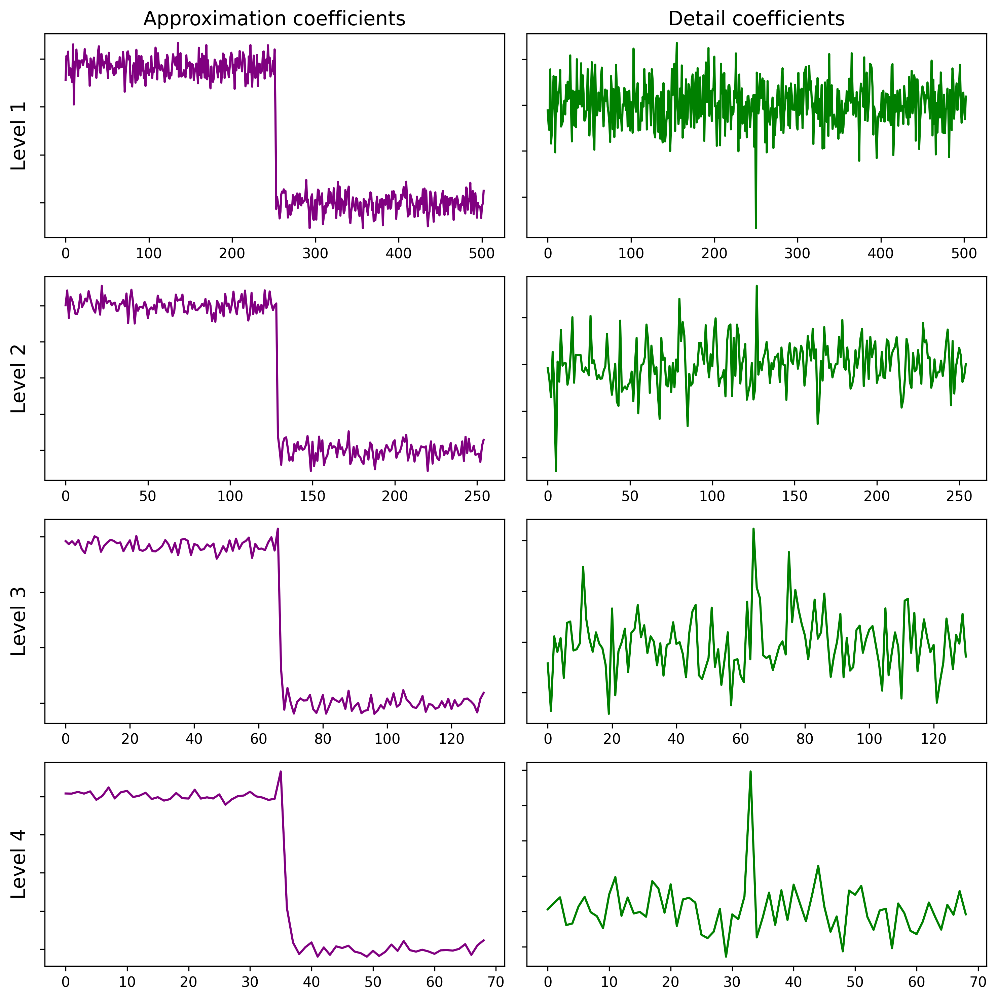

In [33]:
n = 1000
noise_level = 0.1
reference_point = 0.5

time_0, signal_0 = signal_construction(n, reference_point, noise_type='gaussian', noise_level=noise_level)
time, signal = signal_construction(n, reference_point, noise_type='gaussian', noise_level=0.0)

level = 4
wavelet = 'db4'
fig, axarr = plt.subplots(nrows=level, ncols=2, figsize=(10,10), dpi=300)
plot_decomposition(axarr, signal_0, level, wavelet)

##  Обработка сигнала с помощью дискретного вейвлет-преобразования и threshold-процедуры

Итак, мы получили последовательность аппроксимирующих и детализирующих коэффициентов с помощью многоуровневого ДВП. Теперь нам предстоит использовать полученную информацию о сигнале для его фильтрации и последующего нахождения значения reference_point $t_r$ с помощью методов, описанной в первой части работы.

### Threshold techique

Рассмотрим достаточно важную процедуру, связанную c обработкой сигнала с шумом. Это **threshold**-процедура. Суть данной процедуры состоит в том, что последовательность детализирующих коэффициентов подвергается обработке $-$ значения последовательности изменяются в зависимости от того, больше они некоторого заранее выбранного порогового значения или меньше.

Рассмотрим модульную функцию <code><font color='black'>pywt.threshold(data, value, mode='soft', substitute=0)</font></code>.

При значении переменной <code><font color='black'>mode='soft'</font></code>, задающей режим обработки по пороговому значению, все элементы из <code><font color='black'>data</font></code>, которые по модулю меньше <code><font color='black'>value</font></code>, обращаются в <code><font color='black'>substitute</font></code>. Иначе, если модуль элемента из <code><font color='black'>data</font></code> больше <code><font color='black'>value</font></code>, то значение элемента становится равным величине <code><font color='black'>data/np.abs(data) * np.maximum(np.abs(data) - value, 0)</font></code>.

В режиме <code><font color='black'>hard</font></code> все элементы из <code><font color='black'>data</font></code>, которые по модулю меньше <code><font color='black'>value</font></code>, обращаются в <code><font color='black'>substitute</font></code>. Иначе, если модуль элемента из <code><font color='black'>data</font></code> больше <code><font color='black'>value</font></code>, то значение элемента остается неизменным. 

Рассмотрим пример использования threshold-процедуры. Реализуем функцию <code><font color='blue'>threshold_test</font></code>, которая генерирует рандомизированную последовательность чисел и осуществляет над ней обработку по пороговому значению.

In [34]:
def test_threshold(ax, n, thresh):
    num = np.linspace(0, n-1, n)
    up_level=[thresh for i in range(n)]
    down_level=[-thresh for i in range(n)]
    sequence = [2 * random.random() - 1 for i in range(n)]
    sequence_soft = pywt.threshold(sequence, value=thresh, mode='soft')
    sequence_hard = pywt.threshold(sequence, value=thresh, mode='hard')
    
    ax.plot(num, sequence, label='sequence before threshold procedure', color='maroon', alpha=1.0)
    ax.plot(num, sequence_soft, label='soft mode', color='fuchsia', alpha=1.0)
    ax.plot(num, sequence_hard, label='hard mode', color='orange', alpha=1.0)
    ax.plot(num, up_level, ls='dashed', color='gray')
    ax.plot(num, down_level, ls='dashed', color='gray')
    ax.set_xlabel('$n$', fontsize=18)
    plt.xlabel(r'Test sequence', fontsize=18)
    plt.ylabel(r'Sequence after threshold', fontsize=18)
    plt.xticks(color='k', size=16)
    plt.yticks(color='k', size=16)
    plt.legend(fontsize='large')

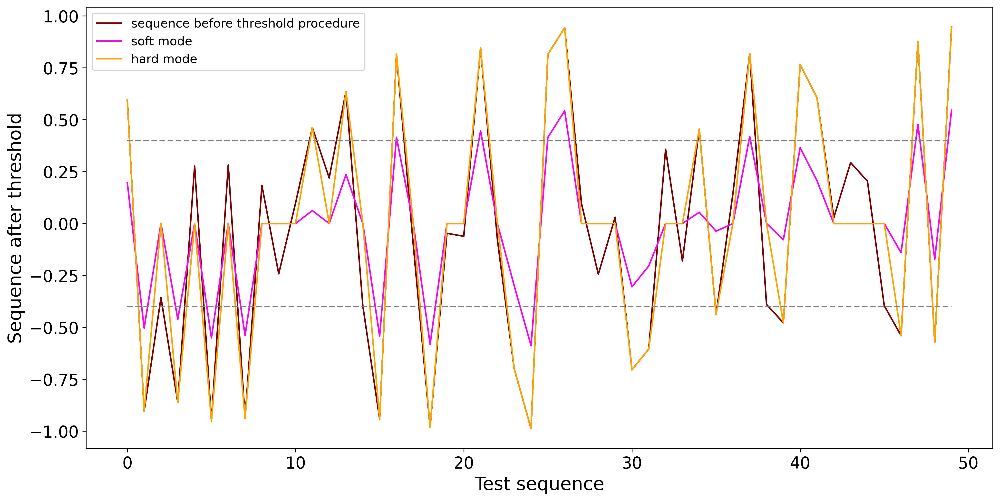

In [35]:
fig, ax = plt.subplots(figsize=(16,8), dpi=300)
test_threshold(ax, n=50, thresh=0.4)

В дальнейшем при обработке сигналов мы будем использовать soft mode.

### Удаление шума в сигнале с помощью threshold-процедуры

Рассмотрим функцию <code><font color='blue'>lowpassfilter</font></code>. Исходный сигнал <code><font color='black'>signal</font></code> подвергается многоуровневому ДВП с использованием вейвлета <code><font color='black'>wavelet</font></code>. Для этого используется модульная функция <code><font color='black'>pywt.wavedec(data, wavelet, mode='symmetric', level=None, axis=-1)</font></code>. <code><font color='black'>coeff</font></code> присваивается список из аппроксимирующих и детализирующих коэффициентов <code><font color='black'>[cA_n, cD_n, cD_n-1, …, cD2, cD1]</font></code>.

Далее производится обработка детализирующих коэффициентов. С помощью функции <code><font color='black'>pywt.threshold</font></code> происходит обнуление коэффициентов, которые по модулю меньше порогового значения <code><font color='black'>thresh</font></code>, и  преобразование коэффициентов согласно описанной раннее процедуре для режима <code><font color='black'>soft</font></code>.

Наконец, производится восстановление сигнала с помощью модульной функции <code><font color='black'>pywt.waverec</font></code>.

Произведём очищение сигнала от шума с помощью описанной процедуры. В качестве вейвлета используем *db4*.

In [39]:
def lowpassfilter(signal, thresh, level, wavelet='db4'):
    """
    Signal reconstruction using DWT noise removing techique.

    Parameters
    ----------
    signal : array_like
        Signal to recom.
    thresh : double
        Threshold parameter.
    level : int
        Number of decomposition levels.
    wavelet : wavelet_type (pywt)
        Wavelet to use for DWT of signal.
    """
    thresh = thresh * np.nanmax(signal)
    print(len(signal))
    coeff = pywt.wavedec(signal, wavelet, mode='symmetric', level=level)
    coeff[1:] = (pywt.threshold(i, value=thresh, mode="soft") for i in coeff[1:])
    reconstructed_signal = pywt.waverec(coeff, wavelet, mode='sym')
    print(len(reconstructed_signal))
    return reconstructed_signal

1000
1000
1000
1000


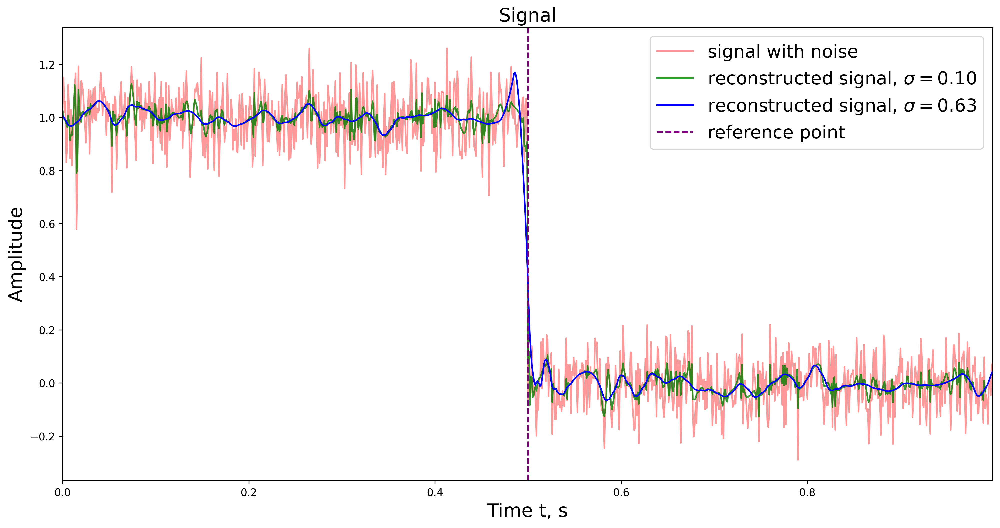

In [40]:
thresh1 = 0.10
thresh2 = 0.63
rec_signal1 = lowpassfilter(signal_0, thresh=0.10, level=level)
rec_signal2 = lowpassfilter(signal_0, thresh=0.63, level=level)
fig, ax = plt.subplots(figsize=(16,8), dpi=300)
plot_signal(ax, time_0, signal_0, plot_color='red', plot_alpha=0.4, plot_label='signal with noise')
plot_signal(ax, time_0, rec_signal1, plot_color='green', plot_alpha=0.8, plot_label='reconstructed signal, $\sigma = ' + '{:.2f}'.format(thresh1)  + '$')
plot_signal(ax, time_0, rec_signal2, plot_color='blue', plot_alpha=1.0, plot_label='reconstructed signal, $\sigma = ' + '{:.2f}'.format(thresh2)  + '$', reference_point=reference_point, rp_color='purple')

На графике, приведенном выше, представлено три сигнала: сигнал с шумом, и два восстановленных сигнала с различными значениями порогового параметра. В одном случае $\sigma = 0{.}10$, а во втором: $\sigma = 0{.}63$.

Оставим на координатной сетке только восстановленные сигналы.

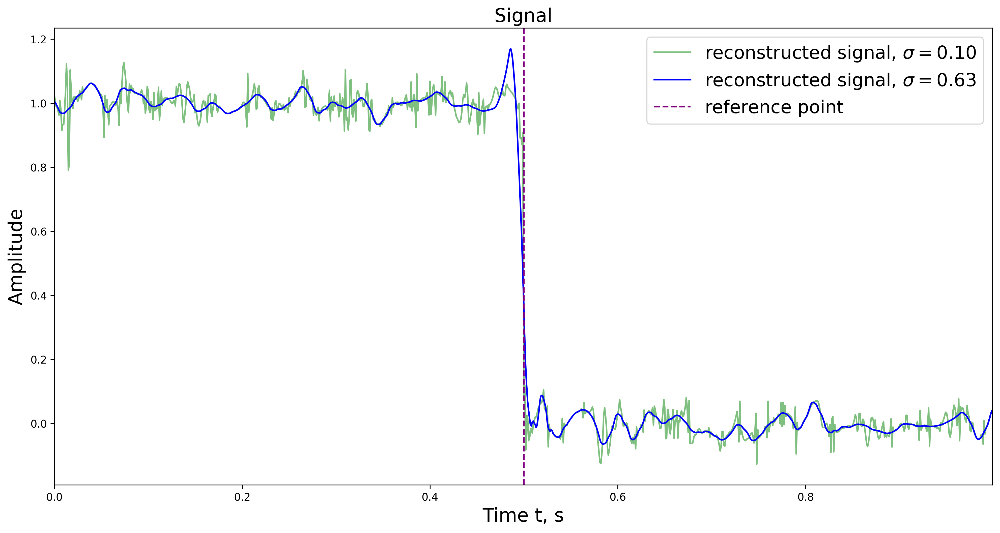

In [38]:
fig, ax = plt.subplots(figsize=(16,8), dpi=300)
plot_signal(ax, time_0, rec_signal1, plot_color='green', plot_alpha=0.5, plot_label='reconstructed signal, $\sigma = ' + '{:.2f}'.format(thresh1)  + '$')
plot_signal(ax, time_0, rec_signal2, plot_color='blue', plot_alpha=1.0, plot_label='reconstructed signal, $\sigma = ' + '{:.2f}'.format(thresh2)  + '$', reference_point=reference_point, rp_color='purple')

Как видно из графиков, при увеличении величины $\sigma$ (<code><font color='black'>thresh</font></code>) наблюдается размытие ступеньки в окрестности разрыва исходного сигнала.

### Boundary effect problem & Signal extension modes

Построим сигнал с достаточно большим уровнем шума <code><font color='black'>noise_level</font></code> и рассмотрим, как влияет выбор параметра <code><font color='black'>mode</font></code> на наличие краевого эффекта, который наблюдается в восстановленном сигнале.

In [58]:
n = 1000
noise_level = 0.3
reference_point = 0.5

time_0, signal_0 = signal_construction(n, reference_point, noise_type='gaussian', noise_level=noise_level)

In [59]:
def lowpassfilter_mode(signal, thresh, level, mode, wavelet='db4'):
    thresh = thresh * np.nanmax(signal)
    coeff = pywt.wavedec(signal, wavelet, mode=mode, level=level)
    coeff[1:] = (pywt.threshold(i, value=thresh, mode="soft") for i in coeff[1:])
    reconstructed_signal = pywt.waverec(coeff, wavelet, mode=mode)
    return reconstructed_signal

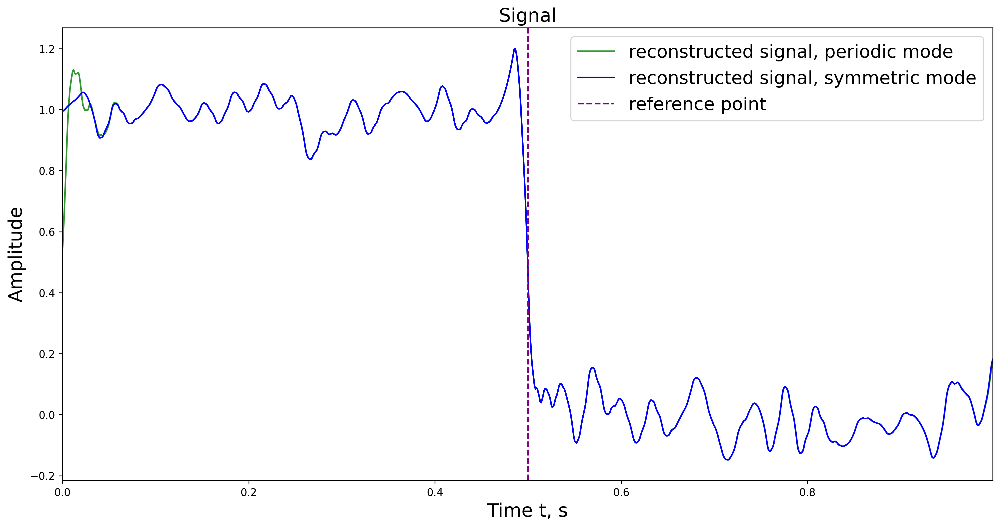

In [62]:
level = 4
rec_per = lowpassfilter_mode(signal_0, 0.63, level, mode='periodic')
rec_symm = lowpassfilter_mode(signal_0, 0.63, level, mode='symmetric')
fig, ax = plt.subplots(figsize=(16,8), dpi=300)
plot_signal(ax, time_0, rec_per, plot_color='green', plot_alpha=0.8, plot_label='reconstructed signal, periodic mode')
plot_signal(ax, time_0, rec_symm, plot_color='blue', plot_alpha=1.0, plot_label='reconstructed signal, symmetric mode', reference_point=reference_point, rp_color='purple')

Как видно из графика, краевые эффекты наиболее сильно проявляются на левой границе при выборе периодического режима. Это естественно $-$ при выборе периодического режима сигнал при $t < 0$ продолжается значениями, которые лежат у правой границы, то есть значениями, осциллирующими вблизи нуля. Это значит, что вблизи $t = 0$ происходит резкий скачок восстановленного сигнала. При выборе симметричного режима данный скачок не наблюдается. 

Важным результатом данного наблюдения является тот факт, что при декомпозиции и восстановлении исследуемого сигнала мы должны использовать симметричный режим. Однако данный выбор определяется характеристиками лишь данного сигнала ступеньки $-$ режим может варьироваться в зависимости от формы исследуемого сигнала. 

### Качество обработки сигнала. Подбор оптимальных параметров для восстановления сигнала

Итак, на входе мы имели некоторый сигнал в виде ступеньки $f(t)$, на него был наложен шум и получен сигнал $x(t)$. После этого мы подвергли его декомпозиции с помощью DWT, применили для детализирующих коэффициентов на всех уровнях декомпозиции threshold-процедуру. После этого мы получаем новый восстановленный сигнал $\widehat{x}(t)$. Возникает естественный вопрос: как можно сравнить два сигнала $f(t)$ и $\widehat{x}(t)$ и получить некоторую численную характеристику того, насколько "качественно" была произведена обработка сигнала. Для этого рассмотрим функцию

$$\mathcal{Q} = \int\limits_{0}^{1} |f(t) - \widehat{x}(t)|dt,$$

которую будем называть **функцией качества восстановления сигнала**. Данная функция является метрикой в некотором пространстве сигналов, определенных на отрезке $[0, 1]$. Ясно, что функция $\mathcal{Q}$ будет зависеть от многих параметров, в частности, уровня шума $\chi$, выбранного вейвлета для декомпозиции, числа уровней декомпозиции, параметра thresh $\sigma$. Наиболее интересным представляется изучение зависимости $\mathcal{Q}$ от $\chi$ и $\sigma$, а также подбор наиболее оптимальных параметров, которые минимизируют метрику $\mathcal{Q}$.

Построим $m$ сигналов с фиксированным уровнем шума $\chi$ и значением reference point $t_r$. Каждый сигнал пропустим через lowpassfilter с некоторым значением $\sigma$ и некоторым числом уровней декомпозиции. Найдем среднее значение функции качества восстановления сигнала $\mathcal{Q}$ для выборки из $m$ сигналов. Меняя значение $\sigma$, получим зависимость $\mathcal{Q}(\sigma)$. Меняя число уровней декомпозиции, получим несколько таких зависимостей.

Теперь приступим к написанию кода для построения зависимостей $\mathcal{Q}(\sigma)$. Реализуем функцию <code><font color='blue'>generate_signal_sequence</font></code> для генерирования выборки из сигналов и функцию <code><font color='blue'>dependence</font></code> для получения зависимости $\mathcal{Q}(\sigma)$.  Для ускорения процесса вычисления функции $Q$ используем модуль <code><font color='black'>multiprocessing</font></code> и функцию <code><font color='blue'>multiprocessing_dependence</font></code>.

In [63]:
def generate_signal_sequence(m, n, reference_point, noise_type, noise_level):
    signal_sequence = [0 for i in range(m)]
    for i in range(len(signal_sequence)):
        signal_sequence[i] = [0 for j in range(2)]
    for i in range(m):
        time, signal = signal_construction(n, reference_point, noise_type, noise_level)
        signal_sequence[i][0] = time
        signal_sequence[i][1] = signal
    return signal_sequence   

def dependence(sequence, reference_point=0.5, wavelet='db4'):
    m = len(sequence)
    num_level = 5
    thresh = []
    for j in range(250):
        thresh.append(j * 0.0025)
    norm = [0 for l in range(num_level)]
    for l in range(num_level):
        norm[l] = [0 for j in range(len(thresh))]
        for i in range(len(sequence)):
            time = sequence[i][0]
            signal = sequence[i][1]
            for j in range(len(thresh)):
                reconstructed_signal = lowpassfilter(signal, thresh=thresh[j], level = l + 1, wavelet=wavelet)
                diff = [0 for k in range(len(time))]
                for k in range(len(time)):
                    if time[k] < reference_point:
                        diff[k] = abs(reconstructed_signal[k] - 1.0)
                    else:
                        diff[k] = abs(reconstructed_signal[k])
                x = np.cumsum(diff)
                norm[l][j] = norm[l][j] + x[-1] * (time[1] - time[0])/m
    return(thresh, norm) 

def multiprocessing_dependence(sequence):
    part = len(sequence) // mp.cpu_count()
    iterable_sequence = []
    for i in range(mp.cpu_count()):
        frame = sequence[(part * i):(part * (i + 1))]
        iterable_sequence.append(frame)
    with mp.Pool(mp.cpu_count()) as p:
        result = p.map(dependence, iterable_sequence)
    thresh = result[0][0]
    num_level = len(result[0][1])
    for i in range(len(result)):
        norm  = [0 for l in range(num_level)]
        for l in range(num_level):
            norm[l] = [0 for j in range(len(thresh))]
            for j in range(len(thresh)):
                norm[l][j] += result[i][1][l][j]
    return (thresh, norm)

7.446783065795898 s -- program execution


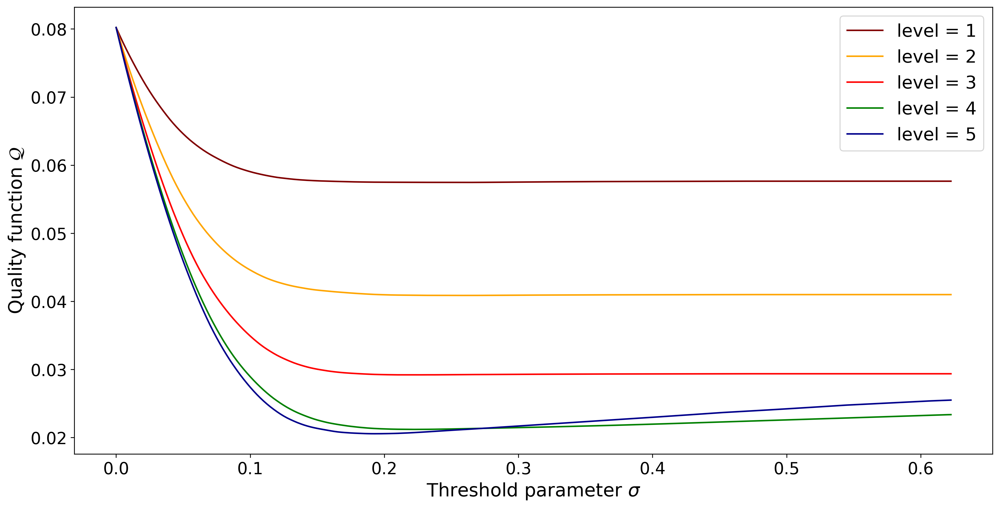

In [68]:
fig, ax = plt.subplots(figsize=(16,8), dpi=300)
colors = ['maroon', 'orange', 'red', 'green', 'darkblue']

sequence = generate_signal_sequence(24, n=1000, reference_point=0.5, noise_type='gaussian', noise_level=0.1)

start_time = tm.time()

(thresh, norm) = multiprocessing_dependence(sequence)

print(tm.time() - start_time, 's -- program execution')

num_level = 5

for l in range(num_level):
    plt.plot(thresh, norm[l], color=colors[l], label='level = ' + '{}'.format(l + 1))

plt.xlabel(r'Threshold parameter $\sigma$', fontsize=18)
plt.ylabel(r'Quality function $\mathcal{Q}$', fontsize=18)
plt.xticks(color='k', size=16)
plt.yticks(color='k', size=16)
plt.legend(fontsize='xx-large')
plt.show()

Как видно из графиков зависимостей $\mathcal{Q}(\sigma)$ для разных значений <code><font color='black'>level</font></code>, зависимость выходит на постоянный уровень при значении <code><font color='black'>level</font></code>, не превышающем трех. Это значит, что как бы мы не увеличивали значение $\sigma$, восстановленный сигнал никак не изменяется. При <code><font color='black'>level = 4</font></code> и <code><font color='black'>level = 5</font></code> зависимость $Q(\sigma)$ возрастает при увеличении $\sigma$. Это связано с эффектами уширения в области разрыва, что мы наблюдали ранее при востановлении сигнала с большим значением порогового параметра $\sigma$.  

Для всех построенных зависимостей $\mathcal{Q}(\sigma)$ существует значение $\sigma_{\text{opt}}$, при котором достигается минимум функции $\mathcal{Q}(\sigma)$. Теперь предлагается варьировать значение уровня шума $\chi$ и строить по $m$ сигналов для каждого выбранного уровня шума $\chi$. Далее мы строим зависимость $\mathcal{Q}(\sigma)$ и находим $\sigma_{\text{opt}}$. Меняя уровень шума, получаем зависимость $\sigma_{\text{opt}}(\chi)$.

Стоит отметить, что $\sigma_{\text{opt}}(\chi)$ строятся отдельно для гауссовского и отдельно для равномерного шума, что мы и сделаем.

In [69]:
def optimal_thresh(m, n, reference_point, noise_type, wavelet):
    noise_level = []
    for j in range(15):
         noise_level.append(j * 0.02)
    optimal_thresh = [0 for l in range(5)]
    for l in range(5):
        optimal_thresh[l] = [0 for j in range(len(noise_level))]

    for j in range(len(noise_level)):
        (thresh, norm, q) = dependence(m, n, reference_point, noise_type, noise_level[j], wavelet)
        for l in range(5):
            optimal_thresh[l][j] = q[l]
        print(j)
    return (noise_level, optimal_thresh)

def plot_optimal_tresh_file(ax, colors, filename):
    with open(filename) as f:
        data = []
        for line in f:
            data.append([float(x) for x in line.split()])

    noise_level = []
    optimal_thresh = [[] for l in range(5)]
    for i in range(len(data)):
        noise_level.append(data[i][0])
        for j in range(1, len(data[i])):
            optimal_thresh[j-1].append(data[i][j])

    def f(x, a, b):
        return a * x + b

    for l in range(len(optimal_thresh)):
        popt, pcov = curve_fit(f, noise_level[0:6], optimal_thresh[l][0:6])
        plt.scatter(noise_level, optimal_thresh[l], color=colors[l], label='level = ' + '{}'.format(l + 1))
        plt.plot(np.array(noise_level), f(np.array(noise_level), *popt), color=colors[l], ls='dashed') 

    ax.set_xlim([0, 0.3])
    plt.axvline(x=0.1, linestyle='dashed', color='gray')
    plt.xlabel(r'Noise level $\chi$', fontsize=18)
    plt.ylabel(r'Optimal threshold parameter $\sigma$', fontsize=18)
    plt.xticks(color='k', size=16)
    plt.yticks(color='k', size=16)

    rect_ax = inset_axes(ax, '100%', '100%', loc='lower left', borderpad=0)
    rect_ax.axis('off')
    left, bottom, width, height = (0.0, 0.0, 0.333, 1.0)
    rect_approx = plt.Rectangle((left, bottom), width, height, facecolor='pink', alpha=0.3, transform=rect_ax.transAxes, label='область применимости аппроксимации' )
    rect_ax.add_patch(rect_approx)
    left, bottom, width, height = (0.333, 0.0, 0.667, 1.0)
    rect_non_approx = plt.Rectangle((left, bottom), width, height, facecolor='green', alpha=0.1, transform=rect_ax.transAxes, label='область неприменимости аппроксимации')
    rect_ax.add_patch(rect_non_approx)
    rect_ax.legend(fontsize='xx-large', loc='lower right', facecolor='white')

    ax.legend(fontsize='xx-large', facecolor='white')
    
def plot_optimal_tresh_list(ax, colors, noise_level, optimal_thresh):
    def f(x, a, b):
        return a * x + b

    for l in range(len(optimal_thresh)):
        popt, pcov = curve_fit(f, noise_level[0:6], optimal_thresh[l][0:6])
        plt.scatter(noise_level, optimal_thresh[l], color=colors[l], label='level = ' + '{}'.format(l + 1))
        plt.plot(np.array(noise_level), f(np.array(noise_level), *popt), color=colors[l], ls='dashed') 

    ax.set_xlim([0, 0.3])
    plt.axvline(x=0.1, linestyle='dashed', color='gray')
    plt.xlabel(r'Noise level $\chi$', fontsize=18)
    plt.ylabel(r'Optimal threshold parameter $\sigma$', fontsize=18)
    plt.xticks(color='k', size=16)
    plt.yticks(color='k', size=16)

    rect_ax = inset_axes(ax, '100%', '100%', loc='lower left', borderpad=0)
    rect_ax.axis('off')
    left, bottom, width, height = (0.0, 0.0, 0.333, 1.0)
    rect_approx = plt.Rectangle((left, bottom), width, height, facecolor='pink', alpha=0.3, transform=rect_ax.transAxes, label='область применимости аппроксимации' )
    rect_ax.add_patch(rect_approx)
    left, bottom, width, height = (0.333, 0.0, 0.667, 1.0)
    rect_non_approx = plt.Rectangle((left, bottom), width, height, facecolor='green', alpha=0.1, transform=rect_ax.transAxes, label='область неприменимости аппроксимации')
    rect_ax.add_patch(rect_non_approx)
    rect_ax.legend(fontsize='xx-large', loc='lower right', facecolor='white')

    ax.legend(fontsize='xx-large', facecolor='white')

Представим результаты, выданные функцией <code><font color='blue'>optimal_thresh</font></code> для гауссовского шума.

In [70]:
noise_level = np.arange(0, 0.28, 0.02)
optimal_thresh = [0 for l in range(5)]
optimal_thresh[0] = [0.0, 0.045, 0.0875, 0.1275, 0.165, 0.205, 0.2475, 0.2625, 0.3075, 0.3575, 0.35, 0.4625, 0.4475, 0.5, 0.5025]
optimal_thresh[1] = [0.0, 0.0475, 0.09, 0.1325, 0.1725, 0.215, 0.26, 0.295, 0.335, 0.3725, 0.435, 0.495, 0.5325, 0.6225, 0.6225]
optimal_thresh[2] = [0.0, 0.0475, 0.09, 0.13, 0.17, 0.21, 0.2425, 0.28, 0.325, 0.355, 0.4075, 0.51, 0.5175, 0.6075, 0.6075]
optimal_thresh[3] = [0.0, 0.045, 0.09, 0.1325, 0.175, 0.205, 0.2375, 0.2675, 0.2975, 0.32, 0.36, 0.3825, 0.415, 0.435, 0.48]
optimal_thresh[4] = [0.0, 0.0425, 0.0825, 0.12, 0.155, 0.185, 0.2175, 0.2525, 0.2725, 0.295, 0.32, 0.345, 0.365, 0.3825, 0.41]

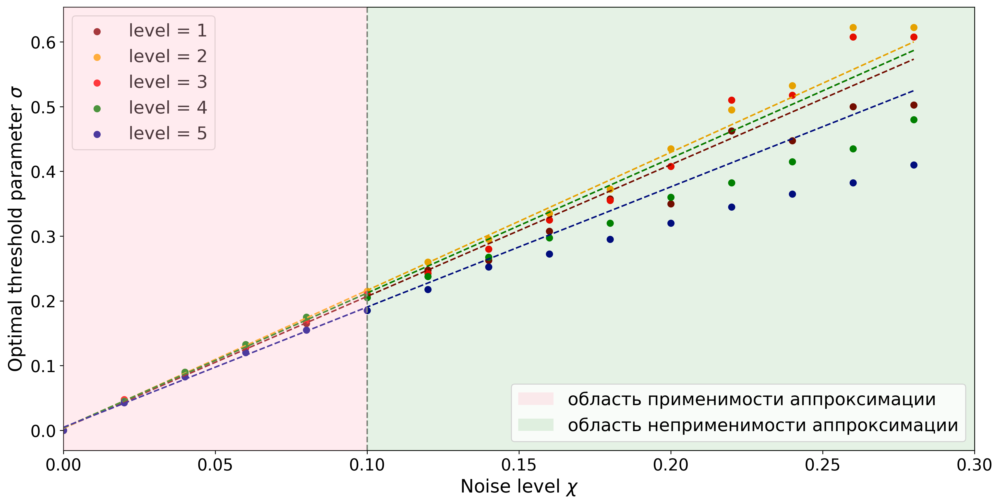

In [72]:
fig, ax = plt.subplots(figsize=(16,8), dpi=300)
colors = ['maroon', 'orange', 'red', 'green', 'darkblue']

plot_optimal_tresh_list(ax, colors, noise_level, optimal_thresh)